# <center>PRÁCTICA 1: APRENDIZAJE NO SUPERVISADO (DengAI)<center>

**Nombre y apellidos:** Jesús Iván Pacheco Romero

**Usuario VIU:** jesusivan.pacheco

---
# Resumen
---

Este proyecto se enfoca en descubrir patrones y agrupaciones en datos que incluyen características de la vegetación y variables climáticas como temperatura, presión y humedad, específicamente para dos ubicaciones en Perú: Iquitos y San Juan. Estas áreas han sido centrales en el estudio del Dengue, con registros de casos en San Juan desde 1990 y en Iquitos a partir del año 2000. La exploración detallada de estos datos es crucial para identificar conexiones entre las variables estudiadas, permitiendo una comprensión más profunda de las diferencias y similitudes anuales y por ubicación en la información recopilada. Para manejar la complejidad y volumen de los datos, aplicaremos la técnica de Análisis de Componentes Principales (PCA) para simplificar la visualización en gráficos bidimensionales sin perder la esencia de la información.

En la búsqueda de las estructuras de agrupación más informativas, se experimentará con varias técnicas de clustering, incluyendo KMeans, DBSCAN, Agrupamiento Jerárquico, y el enfoque basado en Gaussianas. Los resultados preliminares indican que KMeans, el método de Gaussianas, y el Agrupamiento Jerárquico con el método average, logran distinguir claramente entre dos conglomerados principales para San Juan y un único grupo representativo para Iquitos. Este análisis no solo resalta la capacidad de estas técnicas para organizar y clasificar datos complejos, sino también abre caminos hacia análisis más detallados.


---
# Inicialización
---

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pandas as pd


from numpy import corrcoef, transpose, arange
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples
from sklearn.metrics import davies_bouldin_score
from scipy.cluster.hierarchy import dendrogram, linkage


In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

class Visualizador_Features:
    def __init__(self, data):
        self.data = data

    def plot_box_strip(self, rows, cols, col_x, title, fig_size, color='blue', font_y=8,font_x=8):
        fig, axes = plt.subplots(rows, cols, figsize=fig_size)
        fig.tight_layout(pad=3.0, h_pad=3)

        for i in range(1, len(self.data.columns), 1):
            ax = sns.boxplot(data=self.data, y=self.data.iloc[:, i], x=col_x, ax=axes[(i-1)//cols, (i-1)%cols], color=".9", dodge=True, fliersize=False)
            ax.set_xlabel(col_x, fontsize=font_x)
            ax.set_ylabel(self.data.columns[i], fontsize=font_y)
            sns.stripplot(data=self.data, y=self.data.iloc[:, i], ax=axes[(i-1)//cols, (i-1)%cols], x=col_x, color=color)

        fig.suptitle(title, fontsize=16)
        plt.show()


    def plot_reg(self, rows, cols, title, fig_size, color='blue',font_y=8):
      fig, axes = plt.subplots(rows, cols, figsize=fig_size)
      fig.tight_layout(pad=3.0, h_pad=3)

      for i in range(1, len(self.data.columns), 1):
        ax = sns.regplot(data=self.data, x=self.data.iloc[:, i].index, y=self.data.iloc[:, i],scatter_kws={"color": color}, line_kws={"color": "black"},ax=axes[(i-1)//cols, (i-1)%cols])
        ax.set_xlabel('Índice')
        ax.set_ylabel(self.data.columns[i], fontsize=font_y)
      fig.suptitle(title, fontsize=16)
      plt.show()




    def plot_hist(self, rows, cols, title, fig_size, color='blue',font_x=8):
      fig, axes = plt.subplots(rows, cols, figsize=fig_size)
      fig.tight_layout(pad=3.0, h_pad=3)
      for i in range(1, len(self.data.columns), 1):
        ax=sns.histplot(data=self.data, x=self.data.iloc[:, i],ax=axes[(i-1)//cols, (i-1)%cols], color=color)
        ax.set_xlabel(self.data.columns[i], fontsize=font_x)

      fig.suptitle(title, fontsize=16)
      plt.show()




In [10]:
# Subir el conjunto de entrenamiento sin variable objetivo (dengue_features_train.csv)
train = pd.read_csv('dengue_features_train.csv', encoding='utf-8')
print(train.shape)
train.head()

(1456, 24)


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


---
# Exploración
---

In [11]:
# EJEMPLO: Eliminar variable week_start_date por ser de tipo cadena de texto sin formato
train.drop("week_start_date", axis = 1, inplace = True)

In [12]:
# EJEMPLO: Contar valores perdidos
train.isnull().sum()

city                                       0
year                                       0
weekofyear                                 0
ndvi_ne                                  194
ndvi_nw                                   52
ndvi_se                                   22
ndvi_sw                                   22
precipitation_amt_mm                      13
reanalysis_air_temp_k                     10
reanalysis_avg_temp_k                     10
reanalysis_dew_point_temp_k               10
reanalysis_max_air_temp_k                 10
reanalysis_min_air_temp_k                 10
reanalysis_precip_amt_kg_per_m2           10
reanalysis_relative_humidity_percent      10
reanalysis_sat_precip_amt_mm              13
reanalysis_specific_humidity_g_per_kg     10
reanalysis_tdtr_k                         10
station_avg_temp_c                        43
station_diur_temp_rng_c                   43
station_max_temp_c                        20
station_min_temp_c                        14
station_pr

Luego de Observar que existen valores faltantes para las diferentes características, utilizaremos diferentes métodos para llenar valores faltantes, uno de ellos es el pandas.DataFrame.interpolate sugerido por el docente. Este método es una buena opción si se puede tener alguna idea de si la característica es lineal o no, por lo que para tratar de encontrar está relación se generan histogramas, Boxplot y gráficos de regresión para cada característica. Para tratar Datos atípicos se revisarán si están por encima o por debajo de 1.5IQR, pero esto considerando que la distribución de la característica sea Normal, ya que si es sesgada hay que entrar a detalle porque puede ser que la regla de 1.5IQR no funcione de forma apropiada para determinar outliers, sino más bien grupos.

In [13]:
lista_train=train.columns.tolist()
df = train.drop(columns=['year', 'weekofyear'])
df['city'].value_counts()
train.groupby('city')['year'].describe()


,count,mean,std,min,25%,50%,75%,max
city,,,,,,,,
iq,520.0,2005.000000,2.918283,2000.0,2002.75,2005.0,2007.25,2010.0
sj,936.0,1998.826923,5.212076,1990.0,1994.00,1999.0,2003.00,2008.0


Como primer Punto nos encontramos con que para San Juan hay alrededor del 55,5% más de datos que para Iquitos, está cantidad de datos mayor para la ciudad de San juan está relacionada con una mayor adquisición de data en el tiempo, en la tabla anterior podemos observar que para la ciudad de san juan se arranca con datos de 1990 mientras que para Iquitos a partir del año 2000 se registra data.

In [14]:
df_iq=df[df['city']=='iq']
df_iq.isnull().sum()

city                                      0
ndvi_ne                                   3
ndvi_nw                                   3
ndvi_se                                   3
ndvi_sw                                   3
precipitation_amt_mm                      4
reanalysis_air_temp_k                     4
reanalysis_avg_temp_k                     4
reanalysis_dew_point_temp_k               4
reanalysis_max_air_temp_k                 4
reanalysis_min_air_temp_k                 4
reanalysis_precip_amt_kg_per_m2           4
reanalysis_relative_humidity_percent      4
reanalysis_sat_precip_amt_mm              4
reanalysis_specific_humidity_g_per_kg     4
reanalysis_tdtr_k                         4
station_avg_temp_c                       37
station_diur_temp_rng_c                  37
station_max_temp_c                       14
station_min_temp_c                        8
station_precip_mm                        16
dtype: int64

Descripción de Los Datos Divididos por ciudad

In [15]:
print('Iquitos')
df_iq.describe()

Iquitos


,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,517.000000,517.000000,517.000000,517.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,483.000000,483.000000,506.000000,512.000000,504.000000
mean,0.263869,0.238783,0.250126,0.266779,64.245736,297.869538,299.133043,295.492982,307.082752,292.866667,57.609864,88.639117,64.245736,17.096110,9.206783,27.530933,10.566197,34.004545,21.196680,62.467262
std,0.081370,0.076751,0.077354,0.086345,35.218995,1.170997,1.332073,1.417229,2.382980,1.663069,50.286555,7.583889,35.218995,1.445769,2.448525,0.921769,1.535496,1.325261,1.260327,63.245958
min,0.061729,0.035860,0.029880,0.064183,0.000000,294.635714,294.892857,290.088571,300.000000,286.900000,0.000000,57.787143,0.000000,12.111429,3.714286,21.400000,5.200000,30.100000,14.700000,0.000000
25%,0.200000,0.179540,0.194743,0.204129,39.105000,297.092500,298.221429,294.593929,305.200000,291.975000,24.065000,84.295000,39.105000,16.102857,7.371429,27.000000,9.500000,33.200000,20.600000,17.200000
50%,0.263643,0.232971,0.249800,0.262143,60.470000,297.822857,299.121429,295.852143,307.050000,293.050000,46.440000,90.917143,60.470000,17.428571,8.964286,27.600000,10.625000,34.000000,21.300000,45.300000
75%,0.319971,0.293929,0.302300,0.325150,85.757500,298.649286,300.123214,296.548571,308.700000,294.200000,71.072500,94.563929,85.757500,18.180357,11.014286,28.100000,11.655000,34.900000,22.000000,85.950000
max,0.508357,0.454429,0.538314,0.546017,210.830000,301.637143,302.928571,298.450000,314.000000,296.000000,362.030000,98.610000,210.830000,20.461429,16.028571,30.800000,15.800000,42.200000,24.200000,543.300000


In [16]:
df_sj=df[df['city']=='sj']
df_sj.isnull().sum()

city                                       0
ndvi_ne                                  191
ndvi_nw                                   49
ndvi_se                                   19
ndvi_sw                                   19
precipitation_amt_mm                       9
reanalysis_air_temp_k                      6
reanalysis_avg_temp_k                      6
reanalysis_dew_point_temp_k                6
reanalysis_max_air_temp_k                  6
reanalysis_min_air_temp_k                  6
reanalysis_precip_amt_kg_per_m2            6
reanalysis_relative_humidity_percent       6
reanalysis_sat_precip_amt_mm               9
reanalysis_specific_humidity_g_per_kg      6
reanalysis_tdtr_k                          6
station_avg_temp_c                         6
station_diur_temp_rng_c                    6
station_max_temp_c                         6
station_min_temp_c                         6
station_precip_mm                          6
dtype: int64

In [17]:
df_sj=df[df['city']=='sj']
print('San juan')
df_sj.describe()

San juan


,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,745.000000,887.000000,917.000000,917.000000,927.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000,927.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000
mean,0.057925,0.067469,0.177655,0.165956,35.470809,299.163653,299.276920,295.109519,301.398817,297.301828,30.465419,78.568181,35.470809,16.552409,2.516267,27.006528,6.757373,31.607957,22.600645,26.785484
std,0.107153,0.092479,0.057166,0.056073,44.606137,1.236429,1.218637,1.569943,1.258927,1.294705,35.628055,3.389488,44.606137,1.560923,0.498892,1.415473,0.835993,1.717297,1.506277,29.325811
min,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,295.938571,296.114286,289.642857,297.800000,292.600000,0.000000,66.735714,0.000000,11.715714,1.357143,22.842857,4.528571,26.700000,17.800000,0.000000
25%,0.004500,0.016425,0.139283,0.129157,0.000000,298.195000,298.300000,293.847857,300.400000,296.300000,10.825000,76.246071,0.000000,15.236429,2.157143,25.842857,6.200000,30.600000,21.700000,6.825000
50%,0.057700,0.068075,0.177186,0.165971,20.800000,299.254286,299.378571,295.464286,301.500000,297.500000,21.300000,78.667857,20.800000,16.845714,2.457143,27.228571,6.757143,31.700000,22.800000,17.750000
75%,0.111100,0.115200,0.212557,0.202771,52.180000,300.132857,300.228571,296.418929,302.400000,298.400000,37.000000,80.963214,52.180000,17.858571,2.800000,28.185714,7.285714,32.800000,23.900000,35.450000
max,0.493400,0.437100,0.393129,0.381420,390.600000,302.200000,302.164286,297.795714,304.300000,299.900000,570.500000,87.575714,390.600000,19.440000,4.428571,30.071429,9.914286,35.600000,25.600000,305.900000


## Análisis General

Mediante los scatter plot generados para cada Feature con respecto cada indice y sabiendo que un número mayor de índice está relacionado con un incremento en la fecha, podemos observar que en Features como nvdi_ne, nvdi_nw, 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', se observa claramente dos grupos con diferentes comportamientos por lo que los siguientes análisis se harán por cada Ciudad y analizando el comportamiento de cada Feature con respecto al incremento del índice, para encontrar si podemos aplicar llenado de datos faltantes con interpolación lineal para cuando exista una relación lineal y llenado ffill par cuando no se encuentre relación. También es importante aclarar que con los Boxplots se encuentra gan cantidad de Outliers que serán tratados, pero primero revisaremos en base al tiempo para así poder trata de mejor manera esos outliers y generar mejores interpolaciones lineales para llenar datos faltantes.Es conveniente analizar las distribuciones con Histogramas ya diviendo cada población con respecto la ciudad.

c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-p

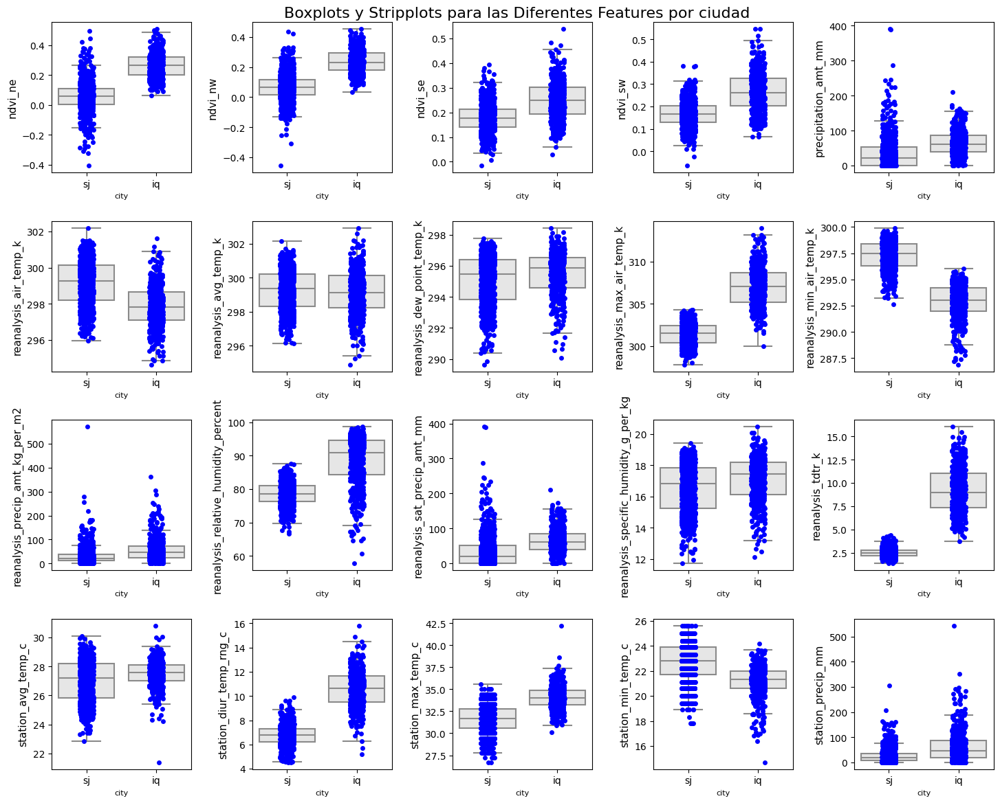

In [18]:
#Se generan Boxplots dividios por ciudad
visualizer = Visualizador_Features(df)

# Luego, llamamos al método plot_box_strip
visualizer.plot_box_strip(rows=4, cols=5, col_x='city', title='Boxplots y Stripplots para las Diferentes Features por ciudad', fig_size=(15,12), font_y=11)


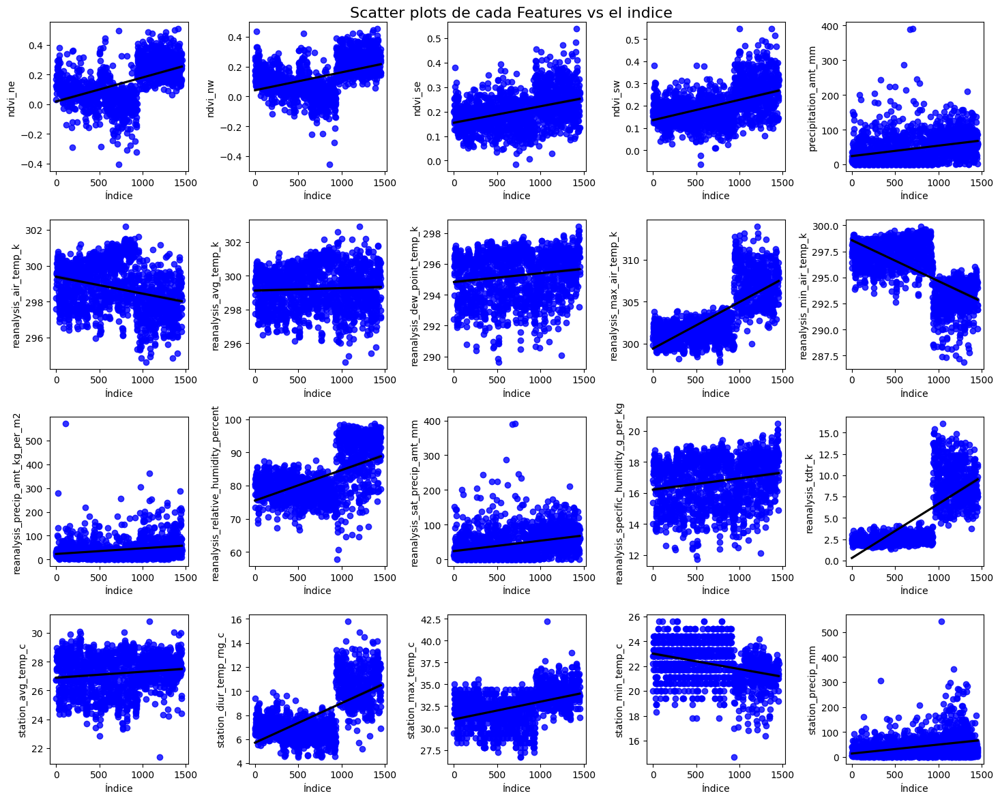

In [19]:
visualizer.plot_reg(rows=4, cols=5, title='Scatter plots de cada Features vs el indice', fig_size=(15, 12), font_y=10)


c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning

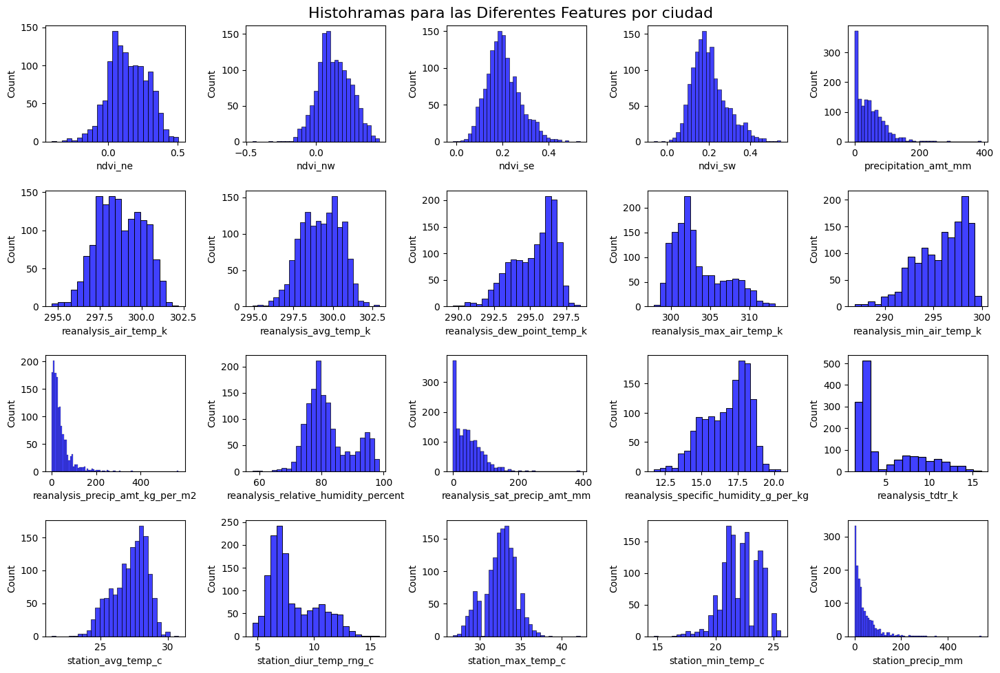

In [20]:
visualizer.plot_hist(rows=4, cols=5, title='Histohramas para las Diferentes Features por ciudad', fig_size=(15, 10), font_x=10)

## Análisis Ciudad San Juan

Para las features asociadas a la ciudad de San juan se puede observar mediante los Boxplots que las características con mayor cantidad de Outliers son,**‘nvdi_ne’ , 'precipitation_amt_mm',’reanalysis_precip_amt_kg_per_m2', 'reanalysis_sat_precip_amt_mm' , 'station_max_temp_c' y '** por lo que es conveniente analizarla por año para ver como es el comportamiento y cuáles son los outliers. Para el grafico de dispersión las características ,**‘nvdi_ne’, ,‘nvdi_nw’, 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k','reanalysis_min_air_temp_k',   'reanalysis_relative_humidity_percent' y 'station_diur_temp_rng_c**  presentan clara relación lineal por lo que para este tipo de Features completaremos los faltantes con interpolate, luego de tratar los outliers.Mediante los Histogramas también podemos observar que las primero cuatro Features relacionadas con ndvi para la cuatro zonas, presentan una distribución muy cercana a la normal, pero para las Features asociadas a la precipitación atmosférica se observa distribuciones sesgadas.

c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\jesus\AppData\Local\Programs\Python\Python311\Lib\site-p

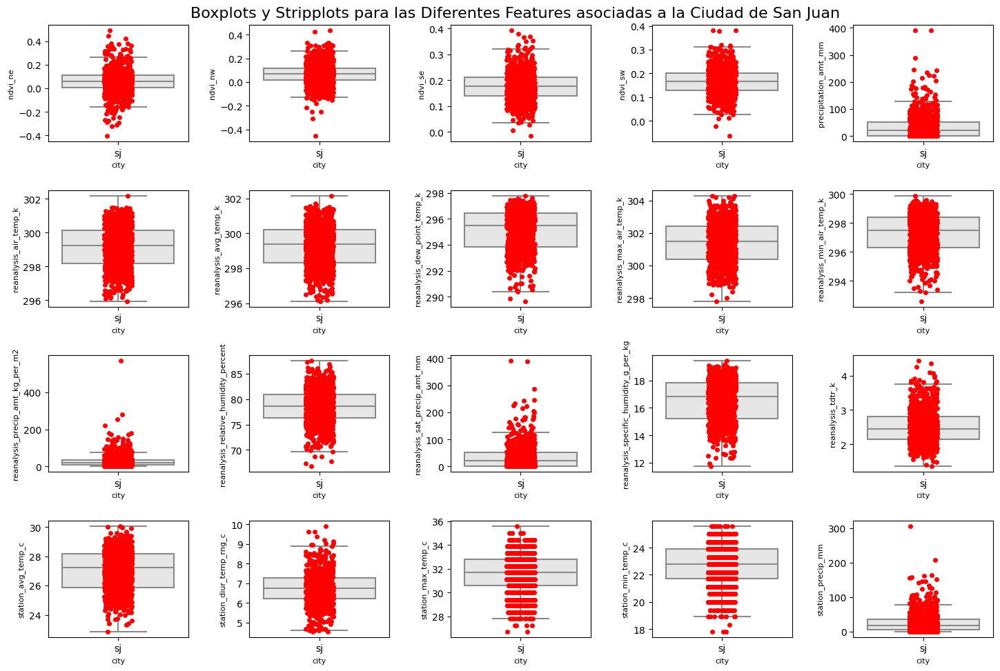

In [21]:
df_sj=df[df['city']=='sj']
visualizer = Visualizador_Features(df_sj)

# Luego, llamamos al método plot_box_strip
visualizer.plot_box_strip(rows=4, cols=5, col_x='city', title='Boxplots y Stripplots para las Diferentes Features asociadas a la Ciudad de San Juan', fig_size=(15,10), color='red')

In [22]:
visualizer.plot_reg(rows=4, cols=5, title='Regplots para Features de San Juan', fig_size=(15, 10), color='red', font_y=10)

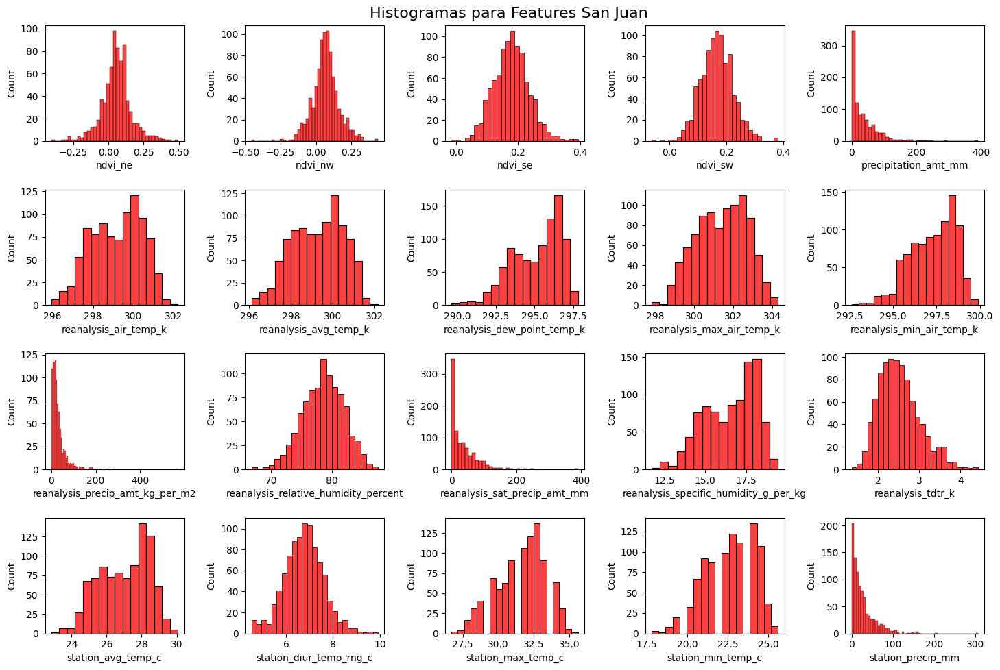

In [ ]:
visualizer.plot_hist(rows=4, cols=5, title='Histogramas para Features San Juan', fig_size=(15, 10), color='red',font_x=10)

## Análisis Ciudad Iquitos

Para las features asociadas a la ciudad de Iquitos se puede observar mediante los Boxplots que las características con mayor cantidad de Outliers son, **’reanalysis_precip_amt_kg_per_m2','reanalysis_relative_humidity_percent', 'station_min_temp_c' y ‘sation_precip_min’ '** por lo que es conveniente analizarla por año para ver como es el comportamiento y cuáles son los outliers. Para el grafico de dispersión las características relacionadas con las Feaures que comienza con la palabra reanalysis presentan relaciones Lineales más notorias Mediante los Histogramas también podemos observar que las primero cuatro Features relacionadas con ndvi para las cuatro zonas, presentan una distribución muy cercana a la normal, pero más alejada a la distribución cercana a la normal presentada en la ciudad de Sanjuan y esto también se puede deber a la cantidad de data.

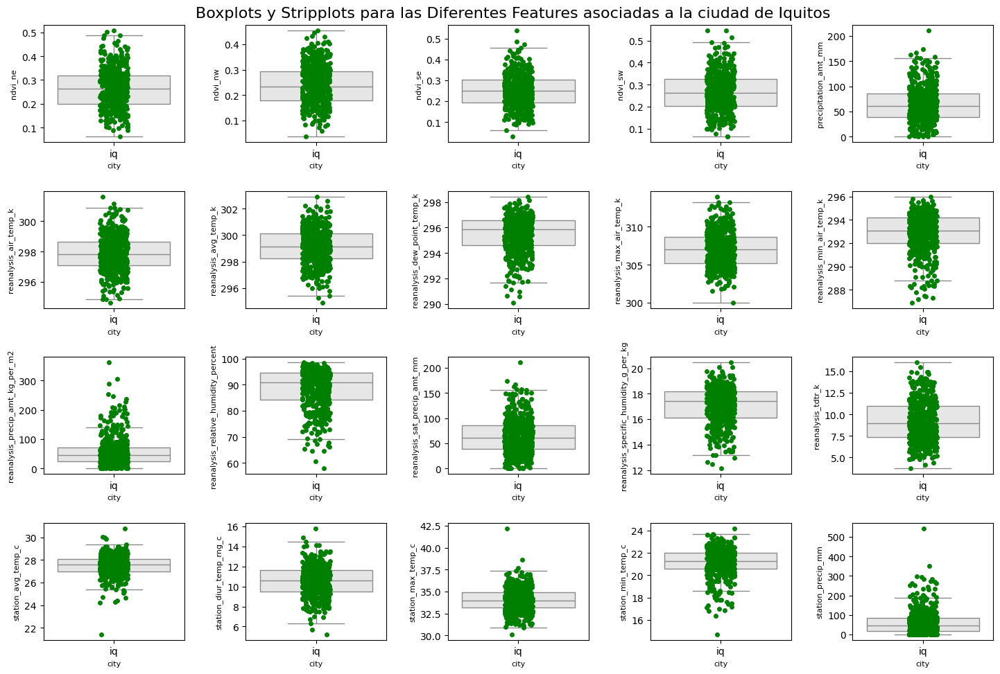

In [ ]:
df_iq=df[df['city']=='iq']

visualizer = Visualizador_Features(df_iq)


# Luego, llamamos al método plot_box_strip
visualizer.plot_box_strip(rows=4, cols=5, col_x='city', title='Boxplots y Stripplots para las Diferentes Features asociadas a la ciudad de Iquitos', fig_size=(15,10), color='green')

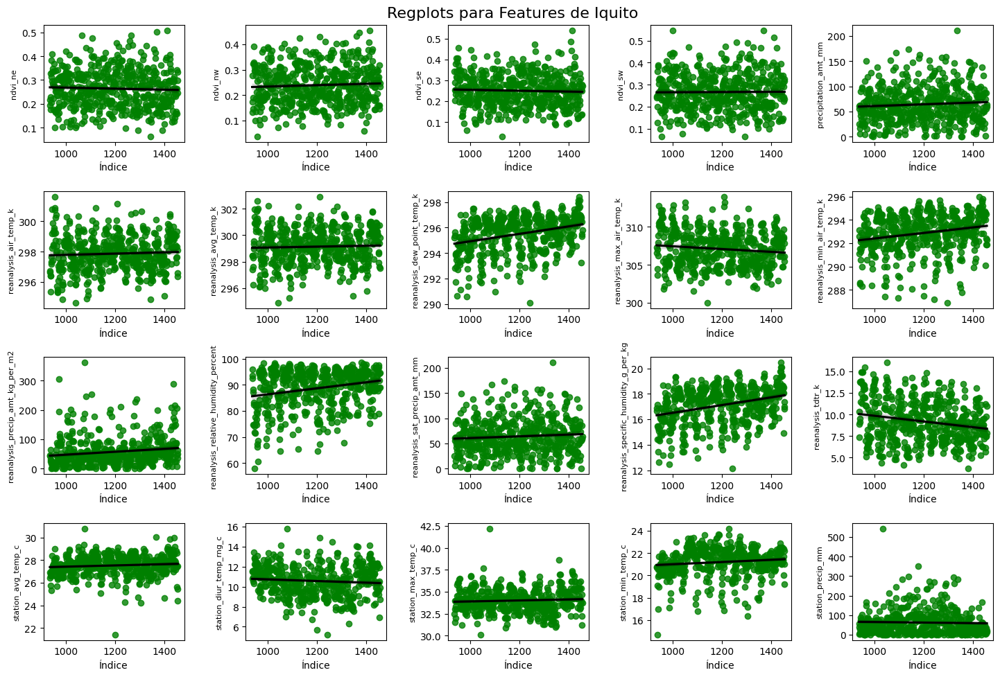

In [ ]:
visualizer.plot_reg(rows=4, cols=5, title='Regplots para Features de Iquito', fig_size=(15, 10), color='green')

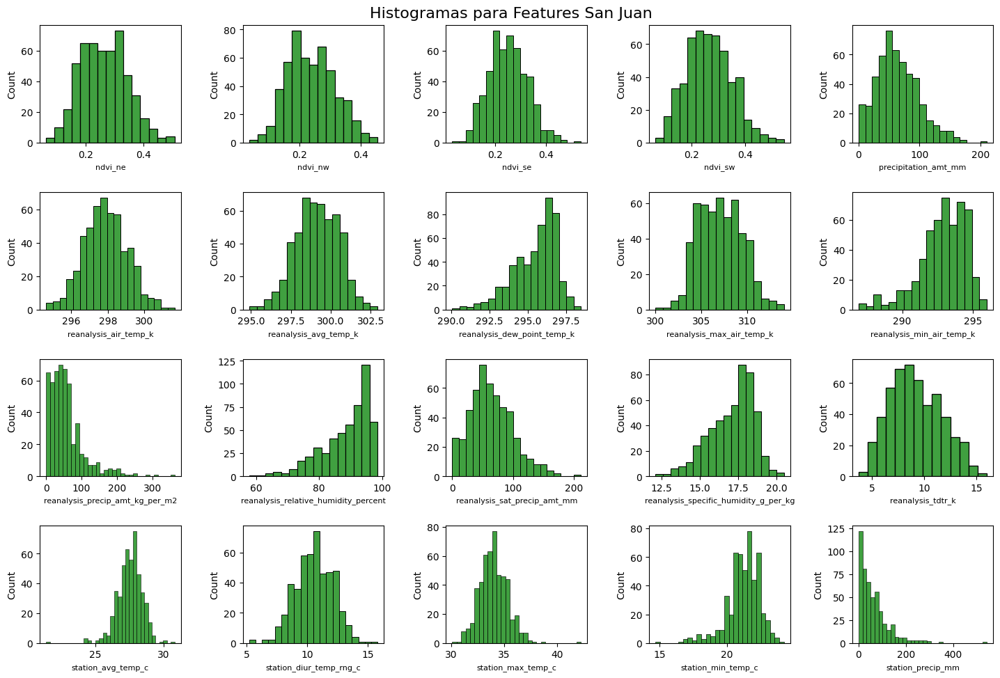

In [ ]:
visualizer.plot_hist(rows=4, cols=5, title='Histogramas para Features San Juan', fig_size=(15, 10), color='green')

## Análisis y tratamiento de outliers por año de las Features ndvi_ne, ndvi_nw, ndvi_se, ndvi_sw para la ciudad de San juan

Se decide realizar el análisis por año en los outliers ya que es claro que para las Features ndvi_ne, ndvi_nw en la ciudad de San juan tienen una fuerte relación lineal con el tiempo de los indices de vegetación para estos dos sectores, mediante el grafico de Dispersión se observa una pendiente negativa con el aumento de los años, lo que nos indica que estás Features pueden mejorarse eliminado los outliers por año, para asi lograr mejores resultados a la hora de llenar datos Faltantes con interpolación lineal. En esta sección se crea una función que identifica los indices outliers por año en las fetures seleccionadas, luego se revisa con el grafico de Boxplot por año si es necesario volver a correr la función para eliminar outliers. Al final de eliminar outliers completamos datos faltantes meidnate el método seleccioando según la feature interpolación lineal o ffill.


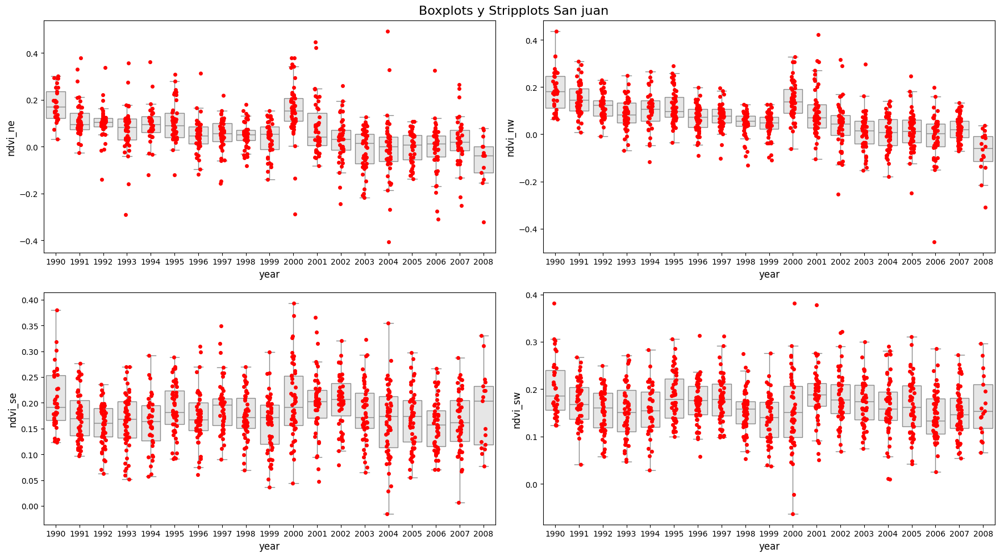

In [ ]:
box_sj=train[train['city']=='sj']

box_sj=box_sj.iloc[:,[1,3,4,5,6]]
visualizer = Visualizador_Features(box_sj)

visualizer.plot_box_strip(rows=2, cols=2, col_x='year', title='Boxplots y Stripplots San juan', fig_size=(18, 10), color='red', font_y=12, font_x=12)



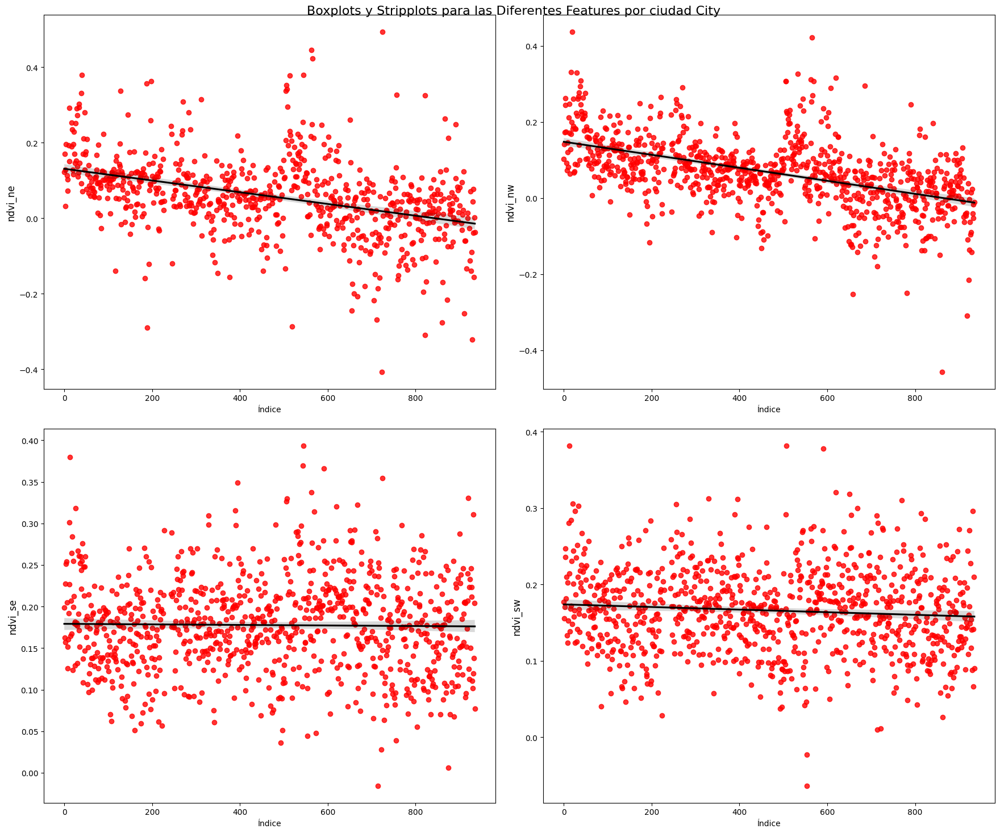

In [ ]:
visualizer.plot_reg(rows=2, cols=2, title='Boxplots y Stripplots para las Diferentes Features por ciudad City', fig_size=(18, 15), color='red', font_y=12)

Tratamiento de Outliers

In [ ]:
def outlier_box_per_year(data,col, factor=1.5):
  #Función para encontrar los indices de los outliers de una Feature clasificada por año
  iqr_por_año = {}
  indices=[]
  indices_=[]
  for año in data['year'].unique():
    df_año = data[data['year'] == año]
    Q1=df_año[col].quantile(0.25)
    Q3= df_año[col].quantile(0.75)
    IQR=Q3-Q1

    lower_bound=Q1-factor*IQR
    upper_bound=Q3+factor*IQR
    indice=df_año[(df_año[col] >= upper_bound) | (df_año[col] <= lower_bound)].index.to_list()
    iqr_por_año[año]=indice
    indices.append(indice)
    indices_=[indice for sublista in indices for indice in sublista]


  return iqr_por_año, indices_

dict_nvdi_ne, list_nvdi_ne=outlier_box_per_year(box_sj, 'ndvi_ne')
indice_nvdi_nw, list_nvdi_nw=outlier_box_per_year(box_sj, 'ndvi_nw')
indice_nvdi_se,list_nvdi_se=outlier_box_per_year(box_sj, 'ndvi_se')
indice_nvdi_sw,list_nvdi_sw=outlier_box_per_year(box_sj, 'ndvi_sw')

lista_unida = list(set(list_nvdi_ne + list_nvdi_nw+ list_nvdi_se+list_nvdi_sw))
print('data antes de eliminar outliers:',len(train))
train=train.drop(lista_unida)
print('data después de eliminar outliers:' ,len(train))



data antes de eliminar outliers: 1456
data después de eliminar outliers: 1363


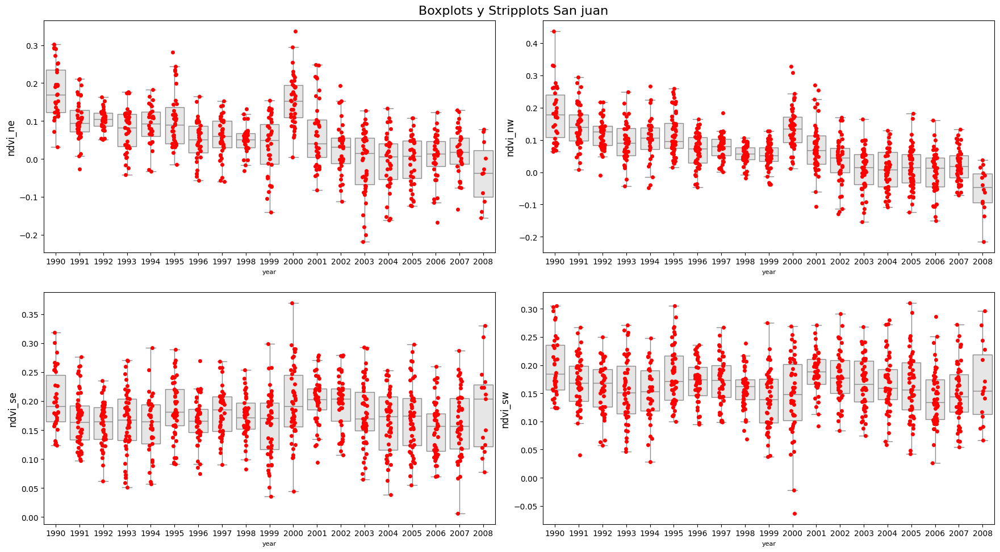

In [ ]:
box_sj=train[train['city']=='sj']

box_sj=box_sj.iloc[:,[1,3,4,5,6]]
box_sj

visualizer = Visualizador_Features(box_sj)

visualizer.plot_box_strip(rows=2, cols=2, col_x='year', title='Boxplots y Stripplots San juan', fig_size=(18, 10), color='red', font_y=12)

In [ ]:
train_sj=train[train['city']=='sj']
print(train_sj.shape)
train_sj.isnull().sum()

(843, 23)


city                                       0
year                                       0
weekofyear                                 0
ndvi_ne                                  179
ndvi_nw                                   47
ndvi_se                                   19
ndvi_sw                                   19
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                         5
station_diur_temp_rng_c                    5
station_max_temp_c                         5
station_min_temp_c                         5
station_pr

Para realizar el llenado de datos Faltantes se realiza un aprueba para Elegir el mejor Método por lo que se selecciona la Feature ndvi_ne y se llenan los datos Faltantes para esta Feature con tres métodos:
* Modelo de Regresión Lineal generado con los datos de la Feature, se llenan los datos con la regresón generada.
* Método interpolate(method='linear'), se llena los datos faltantes con una interpolación entre el dato anterior y el siguinete al faltante
* Método fillna(ffill), se llenan valores faltantes con el valor del punto anterior

Luego de evaluar estos tres métodos de LLenado se decide cual trabajar y en que caso

In [ ]:
#Reset index
train=train.reset_index(drop=True)

In [ ]:
train[train['city'] == 'sj']['ndvi_ne'].isnull().sum()

179

In [ ]:

#Regresión Lineal Feature ndvi_ne
import numpy as np
from scipy.stats import linregress
lista_nan=[]

train_sj_=train[train['city'] == 'sj']
train_sj = train[train['city'] == 'sj'].dropna()

#pendiente y punto de corte en y de la línea de regresión
slope, intercept, _, _, _ = linregress(train_sj.index, train_sj['ndvi_ne'])
# Seleccionar los datos faltantes de San Juan
missing_sj = train_sj_[train_sj_['ndvi_ne'].isnull()]

#  Calcular los valores faltantes usando la tendencia lineal
train_sj_.loc[missing_sj.index, 'ndvi_ne'] = slope * missing_sj.index + intercept
lista=[]
lista=missing_sj.index.tolist()


In [ ]:
#Datos de llenado mediante interpolate() y fillna()
train_inter=train[train['city'] == 'sj']
train_inter.loc[train_inter['city'] == 'sj', 'ndvi_ne'] = train_inter[train_inter['city'] == 'sj']['ndvi_ne'].interpolate(method='linear')

train_ffil=train[train['city'] == 'sj']

train_ffil.loc[train_ffil['city'] == 'sj', 'ndvi_ne'] = train_ffil[train_ffil['city'] == 'sj']['ndvi_ne'].fillna(method='ffill')

<ipython-input-29-45f736abe90e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_inter.loc[train_inter['city'] == 'sj', 'ndvi_ne'] = train_inter[train_inter['city'] == 'sj']['ndvi_ne'].interpolate(method='linear')
<ipython-input-29-45f736abe90e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ffil.loc[train_ffil['city'] == 'sj', 'ndvi_ne'] = train_ffil[train_ffil['city'] == 'sj']['ndvi_ne'].fillna(method='ffill')


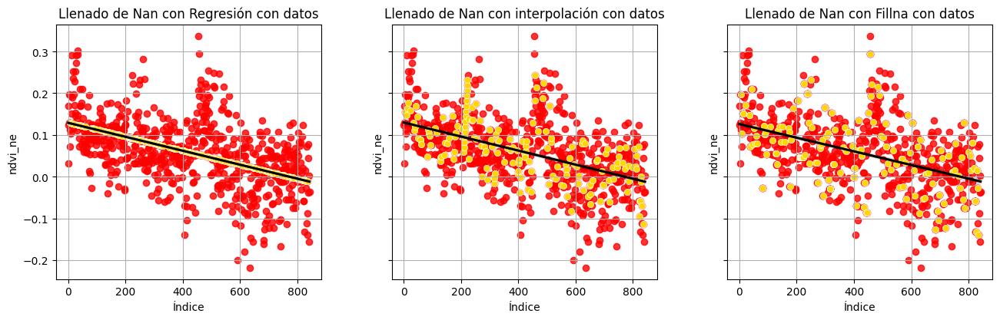

In [ ]:

fig, axes = plt.subplots(1,3,figsize=(14,5), sharey=True,sharex=True,)
fig.tight_layout(pad=5, h_pad=5)

#Regresión modelo datos ndvi_ne

prue=train_sj_[train_sj_.index.isin(lista)]
train_sj=train_sj_[train_sj_['city']=='sj']
ax = sns.regplot(data=train_sj_, x=train_sj_.index, y=train_sj_['ndvi_ne'],
                  scatter_kws={"color": 'red'}, line_kws={"color": "black"},ax=axes[0])
ax=sns.scatterplot(data=prue, x=prue.index, y=prue['ndvi_ne'],
                        color='gold', ax=axes[0])



#modelo interpolate() datos ndvi_ne
prue=train_inter[train_inter.index.isin(lista)]
train_sj=train_inter[train_inter['city']=='sj']

ax = sns.regplot(data=train_sj, x=train_sj.index, y=train_sj['ndvi_ne'],
                  scatter_kws={"color": 'red'}, line_kws={"color": "black"}, ax=axes[1])

ax=sns.scatterplot(data=prue, x=prue.index, y=prue['ndvi_ne'],
                        color='gold', ax=axes[1])


#modelo ffill() datos ndvi_ne
prue=train_ffil[train_ffil.index.isin(lista)]
train_sj=train_ffil[train_ffil['city']=='sj']

ax = sns.regplot(data=train_sj, x=train_sj.index, y=train_sj['ndvi_ne'],
                  scatter_kws={"color": 'red'}, line_kws={"color": "black"}, ax=axes[2])

ax=sns.scatterplot(data=prue, x=prue.index, y=prue['ndvi_ne'],
                        color='gold', ax=axes[2])

axes[0].set_xlabel('Índice')
axes[1].set_xlabel('Índice')
axes[2].set_xlabel('Índice')
axes[0].set_title('Llenado de Nan con Regresión con datos', fontsize=12)
axes[1].set_title('Llenado de Nan con interpolación con datos', fontsize=12)
axes[2].set_title('Llenado de Nan con Fillna con datos', fontsize=12)
axes[0].grid()
axes[1].grid()
axes[2].grid()

plt.show()

Luego de Realizar la comparación utilizando los tres métodos mencionados para llenar datos faltantes observamos el grafico anterior en donde lso datos en color amarillo son lso datos faltantes llenados con los tres difrenetes métodos para una Feature que muestra un comportamiento Lineal como ndvi_ne, se descarta el método de llenar los datos con la regresión gerada con los datos de la Feature ya que se observa un ajuste a exactamente la linea como era de esperar. Por lo que los dos siguinetes métodos se acercan más al comportamiento de la data, se decide para este caso usar el método interpolate para datos que muesran un comportamiento lineal, ya qeu genera una distribución menos dispersa que el fillna, pero el fillan también funciona bien.

In [ ]:
train.loc[train['city'] == 'sj', 'ndvi_ne'] = train[train['city'] == 'sj']['ndvi_ne'].interpolate(method='linear')
train.loc[train['city'] == 'sj', 'ndvi_nw'] = train[train['city'] == 'sj']['ndvi_nw'].interpolate(method='linear')
train.loc[train['city'] == 'sj', 'ndvi_se'] = train[train['city'] == 'sj']['ndvi_se'].fillna(method='ffill')
train.loc[train['city'] == 'sj', 'ndvi_sw'] = train[train['city'] == 'sj']['ndvi_sw'].fillna(method='ffill')

In [ ]:
print(train.shape)
train[train['city'] == 'sj'].isnull().sum()

(1363, 23)


city                                     0
year                                     0
weekofyear                               0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     8
reanalysis_air_temp_k                    5
reanalysis_avg_temp_k                    5
reanalysis_dew_point_temp_k              5
reanalysis_max_air_temp_k                5
reanalysis_min_air_temp_k                5
reanalysis_precip_amt_kg_per_m2          5
reanalysis_relative_humidity_percent     5
reanalysis_sat_precip_amt_mm             8
reanalysis_specific_humidity_g_per_kg    5
reanalysis_tdtr_k                        5
station_avg_temp_c                       5
station_diur_temp_rng_c                  5
station_max_temp_c                       5
station_min_temp_c                       5
station_precip_mm                        5
dtype: int6

In [ ]:
train[train['city']=='sj'].shape

(843, 23)

## Análisis y tratamiento de outliers por año de las Features Restantes de San Juan

Luego de tratar las 4 Features Anteriores para la ciudad de San juan realizamos el tratamiento para las Features Faltantes y al revisar el comportamiento en los graficos de Dispersión encontramos tendecias estacionarias para algunas Features por lo que para estas Features y las que muestran comportamiento lineal se decide realizar el llenado de datos Faltantes con interpolate('linear'), para las qeu no muestran estos comportamientos utilizamos el método fillna().

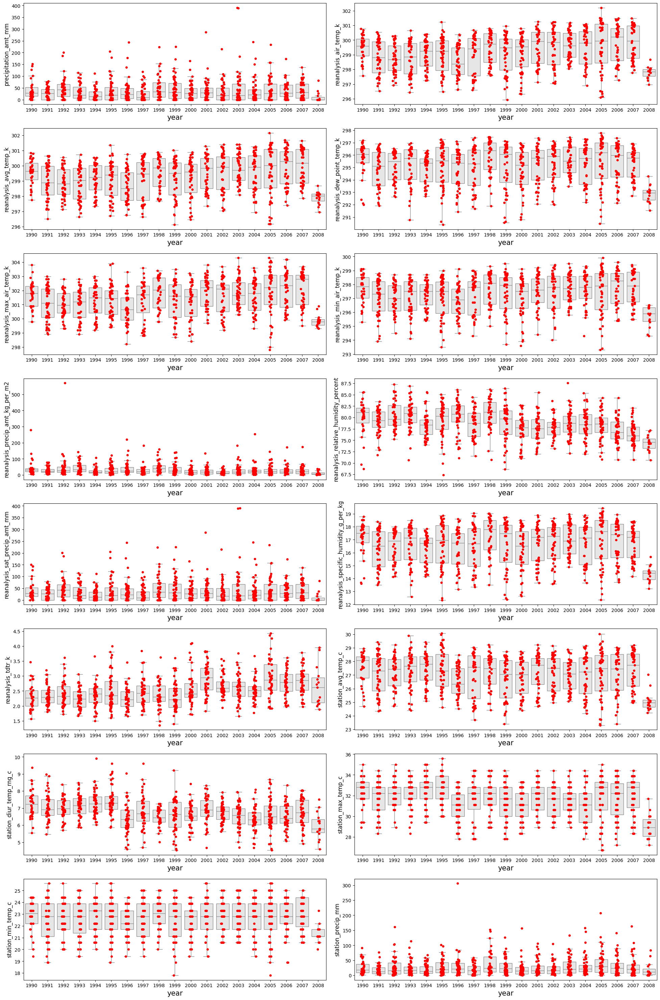

In [ ]:
# box_sj=train[train['city']=='sj']
box_sj=train[train['city']=='sj']

box_sj=box_sj.iloc[:,[1,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22]]
box_sj

visualizer = Visualizador_Features(box_sj)

visualizer.plot_box_strip(rows=8, cols=2, col_x='year', title='', fig_size=(20,30), color='red', font_y=12, font_x=15)

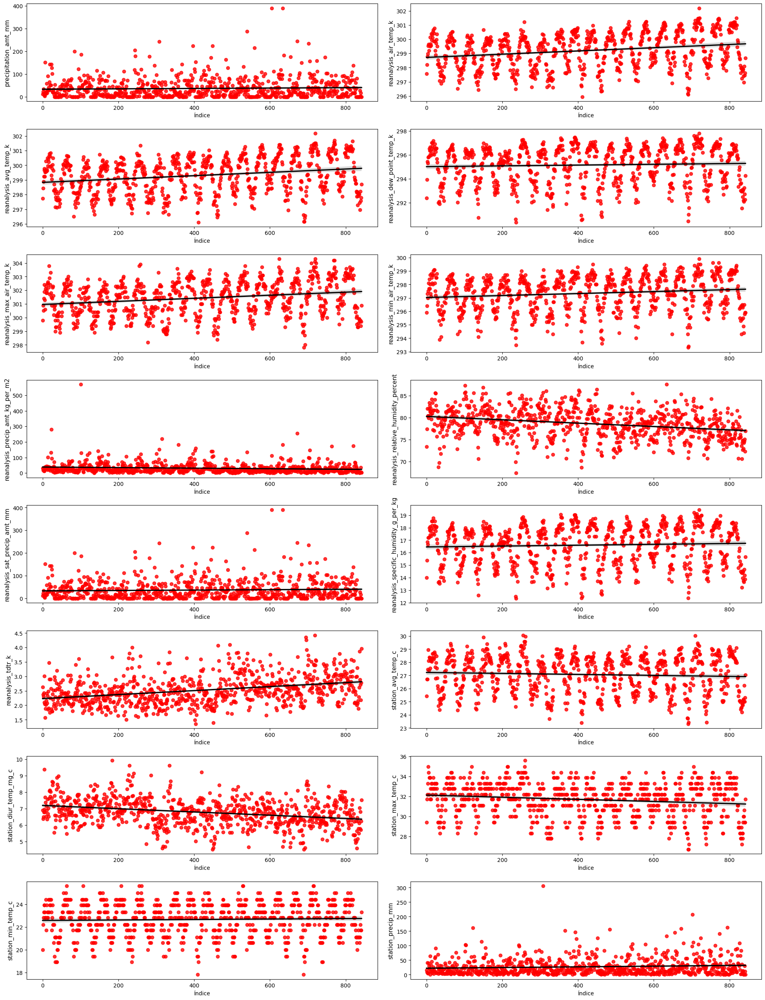

In [ ]:
visualizer.plot_reg(rows=8, cols=2, title='', fig_size=(20, 26), color='red', font_y=11)

In [ ]:
lista_sj_16_fea=box_sj.iloc[:,1:].columns.tolist()

In [ ]:
#Identificamos los outliers guardamos sus indices en la list_total asi como para cada feature los inidices por año en el dict_total si queremos consultar
list_total=[]
dict_total={}
for col in lista_sj_16_fea:
   dict_, list_=outlier_box_per_year(box_sj,col, factor=1.5)

   dict_total[col]=dict_
   list_total.append(list_)

lista_aplanada = set([item for sublist in list_total for item in sublist])
print(len(lista_aplanada))
print(len(train[train['city']=='sj'])-len(lista_aplanada))

155
688


In [ ]:
#Se seleccionan las Features Lineales y estacionarias en una lista y las que no en otra lista
lista_estacionaria_sj=[]
lista_no_estacionaria_sj=[]

lista_estacionaria_sj=train[train['city']=='sj'].iloc[:,[8,9,10,11,12,14,16,17,18,19,20,21]].columns.tolist()
lista_no_estacionaria_sj=train[train['city']=='sj'].iloc[:,[7,13,15,22]].columns.tolist()

In [ ]:
for col in lista_estacionaria_sj:
  train.loc[train['city'] == 'sj', col] = train[train['city'] == 'sj'][col].interpolate(method='linear')

for col in lista_no_estacionaria_sj:
  train.loc[train['city'] == 'sj', col] = train[train['city'] == 'sj'][col].fillna(method='ffill')


In [ ]:
train[train['city']=='sj'].isnull().sum()
print(train.shape)

(1363, 23)


## Análisis y tratamiento de outliers por año de las Features ndvi_ne, ndvi_nw, ndvi_se, ndvi_sw para la ciudad de Iquitos

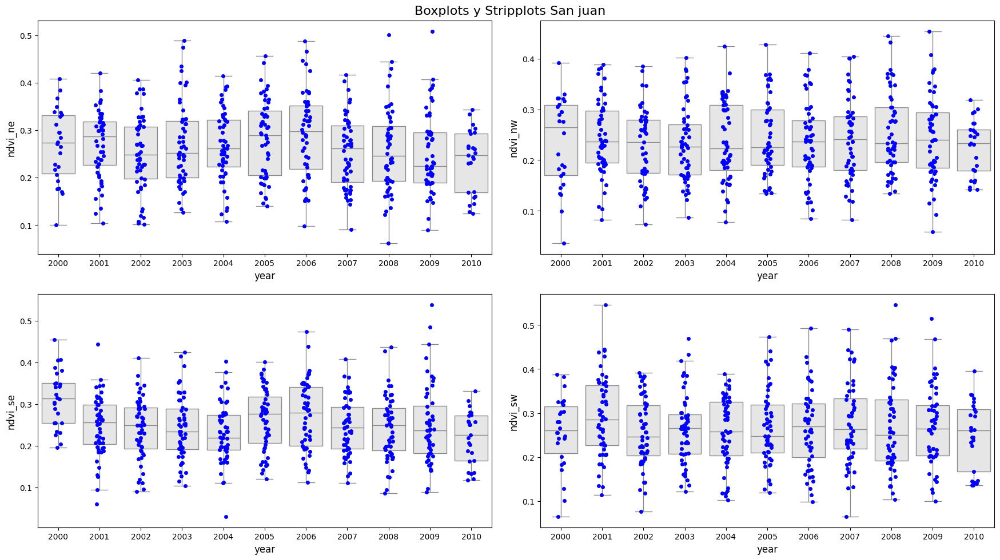

In [ ]:
box_iq=train[train['city']=='iq']

box_iq=box_iq.iloc[:,[1,3,4,5,6]]
visualizer = Visualizador_Features(box_iq)

visualizer.plot_box_strip(rows=2, cols=2, col_x='year', title='Boxplots y Stripplots San juan', fig_size=(18, 10), color='blue', font_y=12, font_x=12)

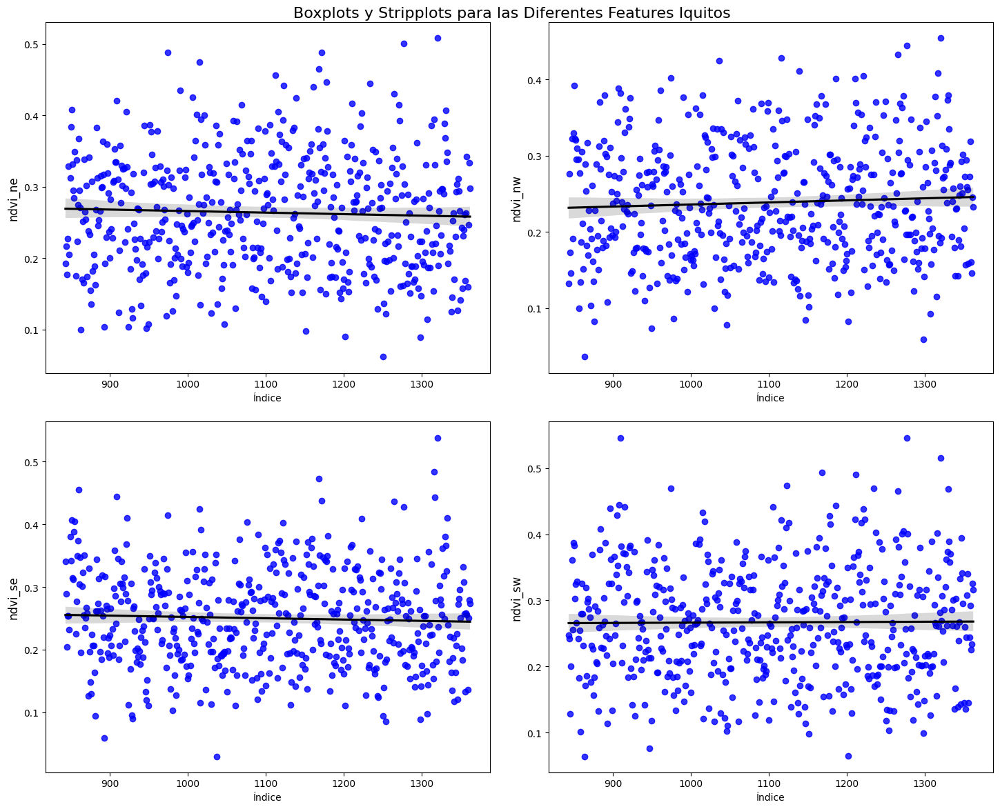

In [ ]:
visualizer.plot_reg(rows=2, cols=2, title='Boxplots y Stripplots para las Diferentes Features Iquitos', fig_size=(15, 12), color='blue', font_y=12)

In [ ]:
dict_nvdi_ne, list_nvdi_ne=outlier_box_per_year(box_iq, 'ndvi_ne')
indice_nvdi_nw, list_nvdi_nw=outlier_box_per_year(box_iq, 'ndvi_nw')
indice_nvdi_se,list_nvdi_se=outlier_box_per_year(box_iq, 'ndvi_se')
indice_nvdi_sw,list_nvdi_sw=outlier_box_per_year(box_iq, 'ndvi_sw')

lista_unida = list(set(list_nvdi_ne + list_nvdi_nw+ list_nvdi_se+list_nvdi_sw))
print('data antes de eliminar outliers:',len(train))
train=train.drop(lista_unida)
print('data después de eliminar outliers:' ,len(train))

data antes de eliminar outliers: 1363
data después de eliminar outliers: 1354


In [ ]:
train=train.reset_index(drop=True)

In [ ]:
train.isnull().sum()

city                                      0
year                                      0
weekofyear                                0
ndvi_ne                                   3
ndvi_nw                                   3
ndvi_se                                   3
ndvi_sw                                   3
precipitation_amt_mm                      4
reanalysis_air_temp_k                     4
reanalysis_avg_temp_k                     4
reanalysis_dew_point_temp_k               4
reanalysis_max_air_temp_k                 4
reanalysis_min_air_temp_k                 4
reanalysis_precip_amt_kg_per_m2           4
reanalysis_relative_humidity_percent      4
reanalysis_sat_precip_amt_mm              4
reanalysis_specific_humidity_g_per_kg     4
reanalysis_tdtr_k                         4
station_avg_temp_c                       37
station_diur_temp_rng_c                  37
station_max_temp_c                       14
station_min_temp_c                        8
station_precip_mm               

In [ ]:
train.loc[train['city'] == 'iq', 'ndvi_ne'] = train[train['city'] == 'iq']['ndvi_ne'].interpolate(method='linear')
train.loc[train['city'] == 'iq', 'ndvi_nw'] = train[train['city'] == 'iq']['ndvi_nw'].interpolate(method='linear')
train.loc[train['city'] == 'iq', 'ndvi_se'] = train[train['city'] == 'iq']['ndvi_se'].fillna(method='ffill')
train.loc[train['city'] == 'iq', 'ndvi_sw'] = train[train['city'] == 'iq']['ndvi_sw'].fillna(method='ffill')

In [ ]:
train.isnull().sum()

city                                      0
year                                      0
weekofyear                                0
ndvi_ne                                   0
ndvi_nw                                   0
ndvi_se                                   0
ndvi_sw                                   0
precipitation_amt_mm                      4
reanalysis_air_temp_k                     4
reanalysis_avg_temp_k                     4
reanalysis_dew_point_temp_k               4
reanalysis_max_air_temp_k                 4
reanalysis_min_air_temp_k                 4
reanalysis_precip_amt_kg_per_m2           4
reanalysis_relative_humidity_percent      4
reanalysis_sat_precip_amt_mm              4
reanalysis_specific_humidity_g_per_kg     4
reanalysis_tdtr_k                         4
station_avg_temp_c                       37
station_diur_temp_rng_c                  37
station_max_temp_c                       14
station_min_temp_c                        8
station_precip_mm               

## Análisis y tratamiento de outliers por año de las Features Restantes de Iquitos

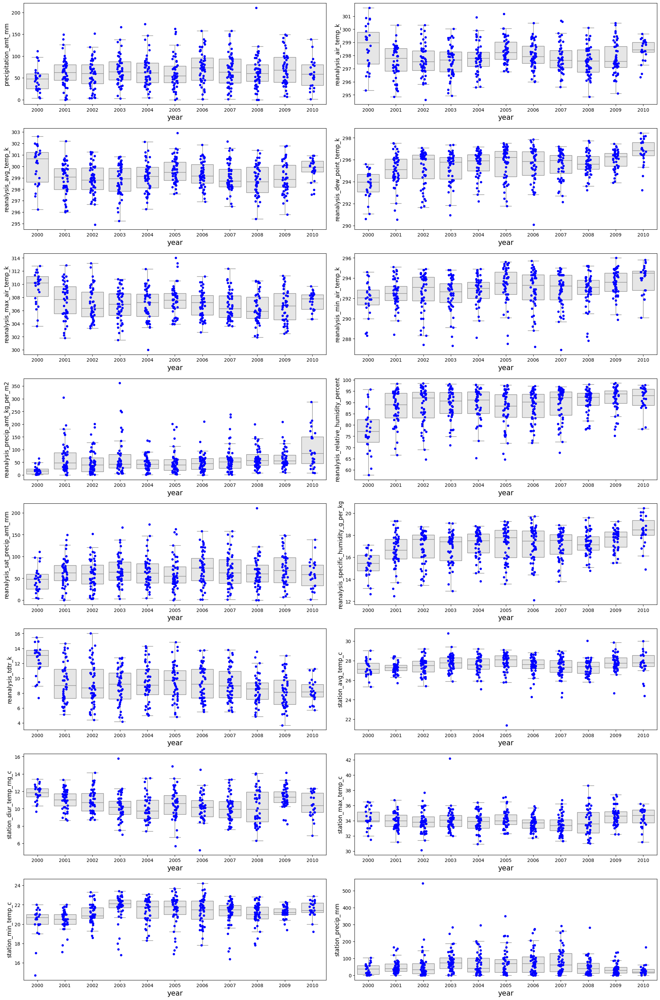

In [ ]:
# box_sj=train[train['city']=='sj']
box_iq=train[train['city']=='iq']

box_iq=box_iq.iloc[:,[1,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22]]
box_iq

visualizer = Visualizador_Features(box_iq)

visualizer.plot_box_strip(rows=8, cols=2, col_x='year', title='', fig_size=(20,30), color='blue', font_y=12, font_x=15)

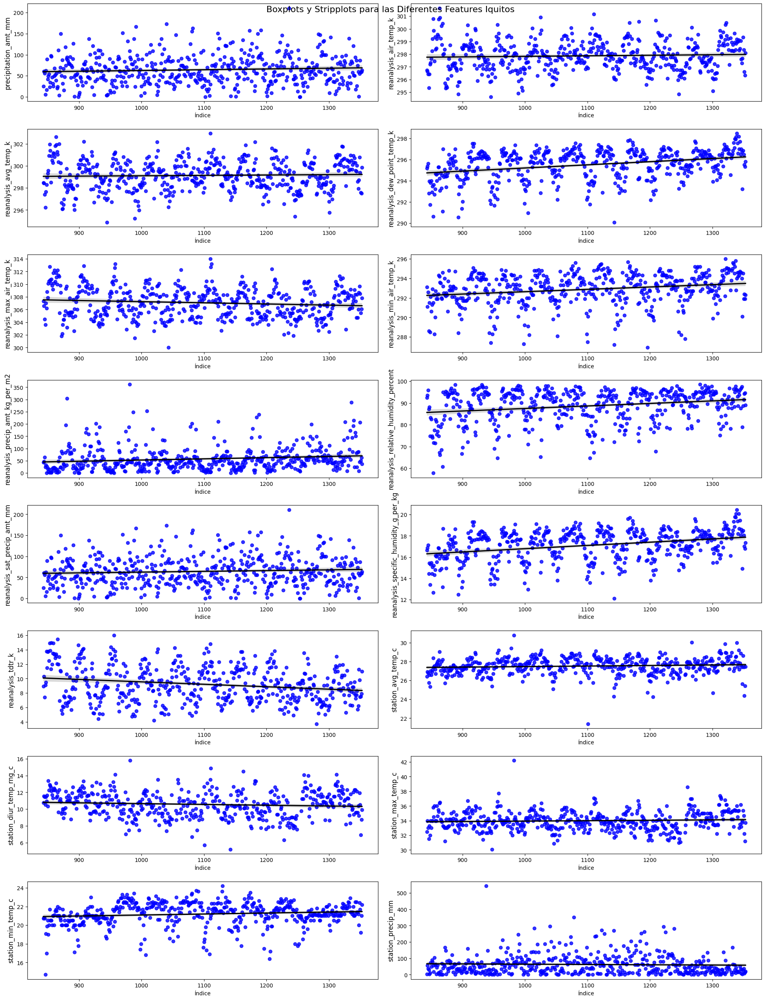

In [ ]:
visualizer.plot_reg(rows=8, cols=2, title='Boxplots y Stripplots para las Diferentes Features Iquitos', fig_size=(20, 26), color='blue', font_y=12)

In [ ]:
lista_iq_16_fea=box_iq.iloc[:,1:].columns.tolist()

In [ ]:
#Identificamos los outliers guardamos sus indices en la list_total asi como para cada feature los inidices por año en el dict_total si queremos consultar
list_total=[]
dict_total={}
for col in lista_iq_16_fea:
   dict_, list_=outlier_box_per_year(box_iq,col, factor=1.5)

   dict_total[col]=dict_
   list_total.append(list_)

lista_aplanada = set([item for sublist in list_total for item in sublist])
print(len(lista_aplanada))
print(len(train[train['city']=='iq'])-len(lista_aplanada))

125
386


In [ ]:
#Se seleccionan las Features Lineales y estacionarias en una lista y las que no en otra lista
lista_estacionaria_iq=[]
lista_no_estacionaria_iq=[]

lista_estacionaria_iq=train[train['city']=='iq'].iloc[:,[8,9,10,11,12,14,16,17,18,19,20,21]].columns.tolist()
lista_no_estacionaria_iq=train[train['city']=='iq'].iloc[:,[7,13,15,22]].columns.tolist()

In [ ]:
for col in lista_estacionaria_iq:
  train.loc[train['city'] == 'iq', col] = train[train['city'] == 'iq'][col].interpolate(method='linear')

for col in lista_no_estacionaria_iq:
  train.loc[train['city'] == 'iq', col] = train[train['city'] == 'iq'][col].fillna(method='ffill')

In [ ]:
print(train.shape)
train[train['city']=='iq'].isnull().sum()

(1354, 23)


city                                     0
year                                     0
weekofyear                               0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_precip_mm                        0
dtype: int6

Al entra

In [ ]:
# EJEMPLO: Binarizador para la variable categórica city en el conjunto de entrenamiento y test
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
train['city_bin'] = lb.fit_transform(train['city'])

train.tail()
train.shape
city_=train['city'].tolist()
train

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin
0,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,1
1,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,1
2,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,1
3,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,1
4,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1349,iq,2010,21,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,...,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,0
1350,iq,2010,22,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,...,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,0
1351,iq,2010,23,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,...,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,0
1352,iq,2010,24,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,...,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0,0


---
# Características
---

In [ ]:
train.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin
0,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,1
1,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,1
2,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,1
3,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,1
4,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,1


In [ ]:
data_total=train #Data total
train=train.iloc[:,3:23] #Data Seleccionada
train.head()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [ ]:
# Se normaliza la data para tener los rangos entre 0 y 1 para todas las features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(train)
X_train

#Se verifica mediante un dataframe si se realizo bien la operación
column_labels = train.columns.tolist()

# Crear un DataFrame de pandas con los datos escalados y las etiquetas de columna
X_train_df = pd.DataFrame(data=X_train, columns=column_labels)

In [ ]:
X_train_df.head()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,0.482243,0.489002,0.411586,0.432885,0.031797,0.388291,0.354667,0.278148,0.123457,0.692308,0.056091,0.381614,0.031797,0.227716,0.086660,0.430091,0.210393,0.174194,0.486239,0.029450
1,0.549224,0.547938,0.334264,0.393146,0.058423,0.472710,0.441778,0.461985,0.191358,0.730769,0.031446,0.479668,0.058423,0.390590,0.069133,0.565350,0.163498,0.322581,0.688073,0.015829
2,0.354301,0.595136,0.323226,0.420722,0.088428,0.548064,0.496000,0.639330,0.166667,0.800000,0.045749,0.594415,0.088428,0.567322,0.064265,0.565350,0.173638,0.354839,0.743119,0.076201
3,0.490787,0.705651,0.473814,0.537516,0.039324,0.575260,0.539556,0.624466,0.222222,0.776923,0.024365,0.552387,0.039324,0.546279,0.073028,0.645897,0.198986,0.425806,0.788991,0.007362
4,0.586466,0.731913,0.524418,0.558084,0.019252,0.645515,0.593778,0.685631,0.253086,0.815385,0.021385,0.555396,0.019252,0.610607,0.112950,0.802432,0.429658,0.535484,0.844037,0.010676


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import itertools
import seaborn as sns
from numpy import corrcoef, transpose, arange
from pylab import pcolor, show, colorbar, xticks, yticks

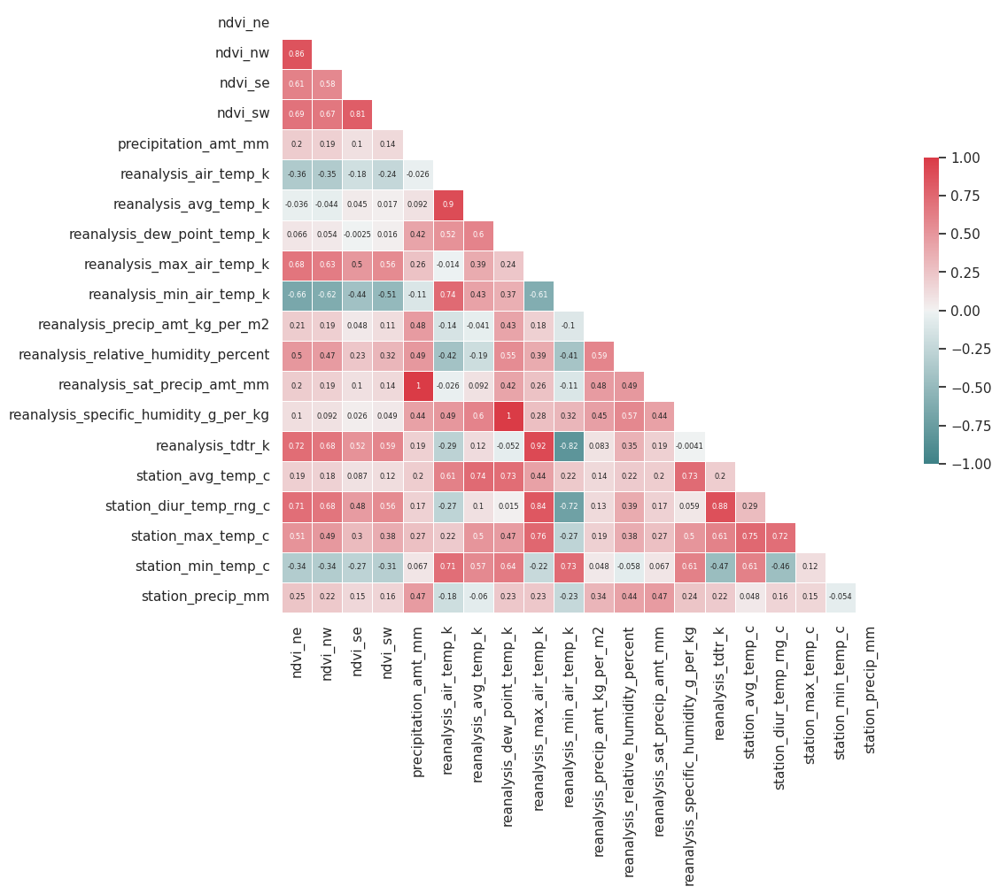

In [ ]:
#Código Modificado y tomado de Notebook 6 Selección de Características, brindado por el docente.
#https://docs.scipy.org/doc/numpy/reference/generated/numpy.corrcoef.html

names = X_train_df.columns.tolist()
R = X_train_df.corr()
# http://stanford.edu/~mwaskom/software/seaborn/examples/many_pairwise_correlations.html
# Generate a mask for the upper triangle
sns.set(style="white")
mask = np.zeros_like(R, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(200, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(R, mask=mask, cmap=cmap,annot=True, vmax=1, vmin=-1,
            square=True, xticklabels=names, yticklabels=names,
            linewidths=.5,annot_kws={'size': 6}, cbar_kws={"shrink": .5}, ax=ax)
plt.show()

Código tomado de Notebook 6 Selección de Características, brindado por el docente.

Al analizar la matriz de Correlación se encuentra que existen características con coefeciente de pearson igual a 1, evidenciando la clara relación entre elllas, para realizar un análisis a detalle de estas se seleccionan las que presentan un coef. de correlación mayor a 0.9 y se revisan sus diagramas de Dispersión.

In [ ]:
for i in range(len(R.columns)):
    R.iloc[i, i] = pd.NA

R_may= R[R>0.9].unstack().sort_values(ascending=False)
R_may=R_may[~R_may.isnull()]

strong_features = R_may.index.get_level_values(0).union(R_may.index.get_level_values(1)).unique().tolist()
strong_features

['precipitation_amt_mm',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k']

Se realizan los graficos de Dispersión entre característica entre Features con coeficiente de correlación mayor a 0.9

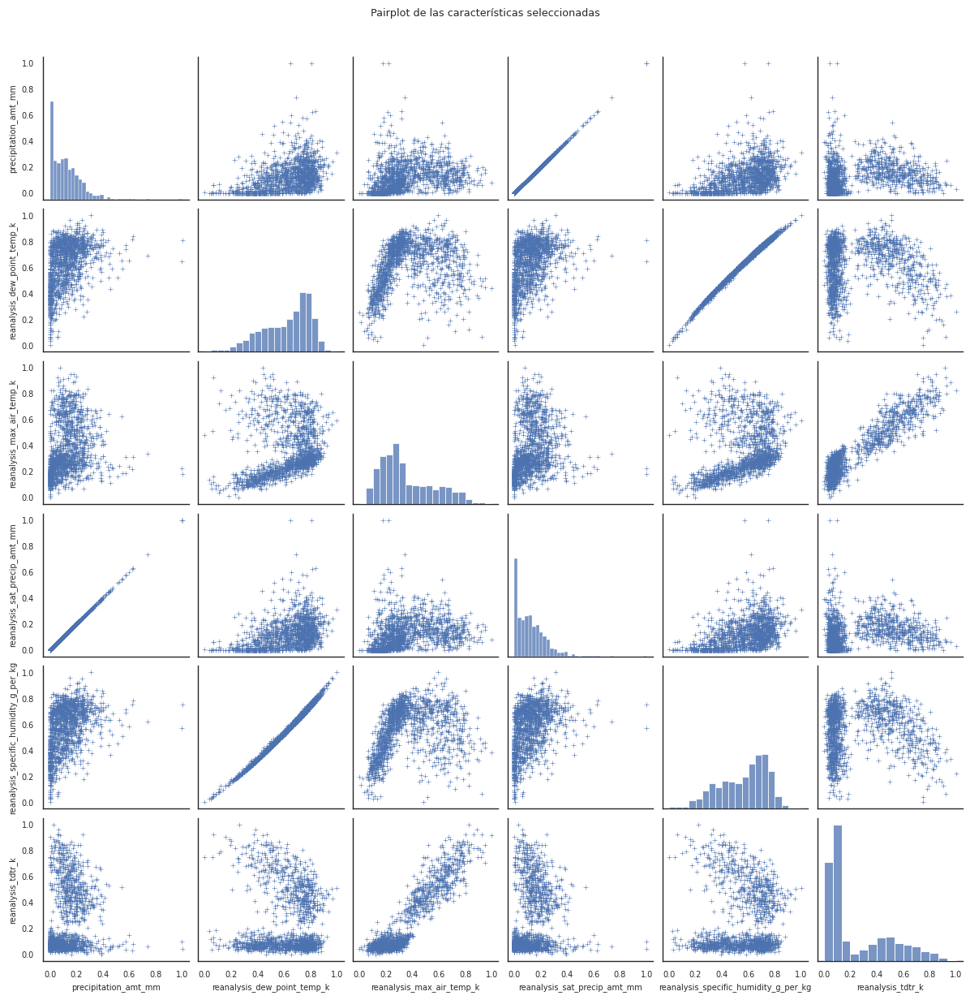

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt


# Configurar el tamaño de la fuente de los ejes
sns.set_context("paper", font_scale=0.8)

# Crear el pairplot con mejoras
pairplot=sns.pairplot(X_train_df[strong_features], height=2, diag_kind='hist', plot_kws={'alpha': 1}, markers='+')

for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=7)
    ax.set_ylabel(ax.get_ylabel(), fontsize=7)


# Añadir título
plt.suptitle("Pairplot de las características seleccionadas", y=1.02)

plt.tight_layout()
plt.show()



In [ ]:
len(X_train_df.columns)

20

La features Precipitation_amt_mm y  reanalysis_sat_precip_amt_mm presentan un coeficiente de correlación de uno al revisar el diagrama de dispersión se encuentra que la relación entre estás es una relación perfecta lineal por lo que seleccionamos solo una de las dos en este caso Precipitation_amt_mm. Para las Features reanalysis_dew_point_temp_k y reanalysis_specific_humidity_g_per_kg también se encuentra coefiente de correlación de 1 por lo que escogemos reanalysis_specific_humidity_g_per_kg ya que representa la cantidad de vapor de agua en el aire por unidad de masa de aire seco.

En las relaciones de las features:

*  reanalysis_dew_point_temp_k - reanalysis_max_air_temp_k
*  precipitation_amt_mm- reanalysis_tdtr_k
*  reanalysis_dew_point_temp_k - reanalysis_tdtr_k
*  reanalysis_sat_precip_amt_mm- reanalysis_tdtr_k
*  reanalysis_specific_humidity_g_per_kg- reanalysis_tdtr_k
*  reanalysis_specific_humidity_g_per_kg- reanalysis_max_air_temp_k




Se puede observar dos grupos diferentes entre estas features dando idea a lo que se observó en la exploración de la data en donde se puede notar la diferencia entre grupos por ciudad.


Para la relación:
*  reanalysis_tdtr_k - reanalysis_max_air_temp_k

se presenta un coef de correlación de 0.92 siendo el segundo coefeiciente mayor al analizar nos damos cuenta que reanalysis_tdtr_k es el rango de temperatura diario, restando a la mayor temperatura la menor temperatura, por lo que está en función de reanalysis_max_air_temp_k,  no se eliminará ninguna pero si se tiene presente esta alta relación.


In [ ]:
X_train_df.drop(columns=['reanalysis_sat_precip_amt_mm','reanalysis_dew_point_temp_k'], inplace=True)

In [ ]:
print(len(names:=X_train_df.columns.tolist()))

18


PCA Features

In [ ]:
pca=PCA()
pca.fit(X_train_df.T)
pca.explained_variance_ratio_

array([6.92185485e-01, 1.60103433e-01, 5.34422264e-02, 3.59466636e-02,
       1.32764268e-02, 9.16198224e-03, 7.25893659e-03, 5.96964206e-03,
       5.38962941e-03, 4.25165682e-03, 4.10496247e-03, 3.80735115e-03,
       1.82401198e-03, 1.36001824e-03, 1.25353943e-03, 3.84558265e-04,
       2.79476963e-04, 8.59367777e-32])

[]

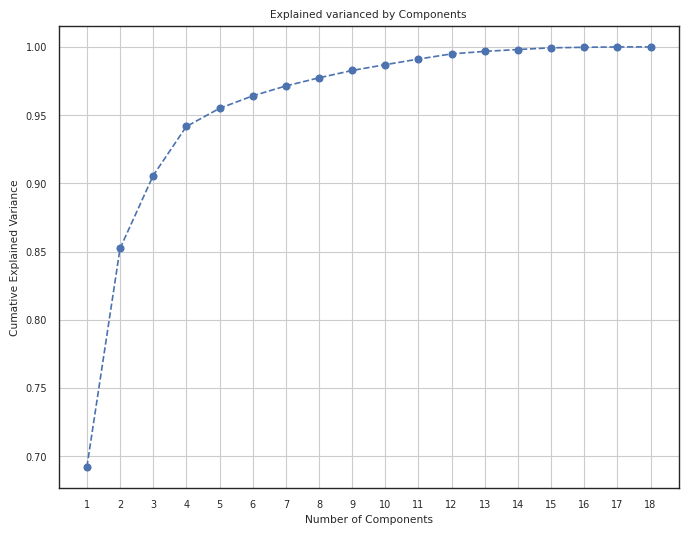

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(range(1,19,1), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title("Explained varianced by Components")
plt.xlabel('Number of Components')
plt.ylabel('Cumative Explained Variance')
plt.xticks(range(1, 20))
plt.grid(True)
plt.plot()

codigo modificado de https://365datascience.com/tutorials/python-tutorials/pca-k-means/

Con el anterior grafico se puede inferir que dos componentes explican más del 80% de la variabilidad de los datos.

Componentes lineales:
 [[-0.02237077 -0.02887765 -0.03123682 ... -0.01636289 -0.01746469
  -0.02023602]
 [-0.00406641 -0.00064746  0.00834089 ... -0.03618192 -0.04749162
  -0.04298589]]

Ratio de variabilidad:  [0.69218548 0.16010343] 



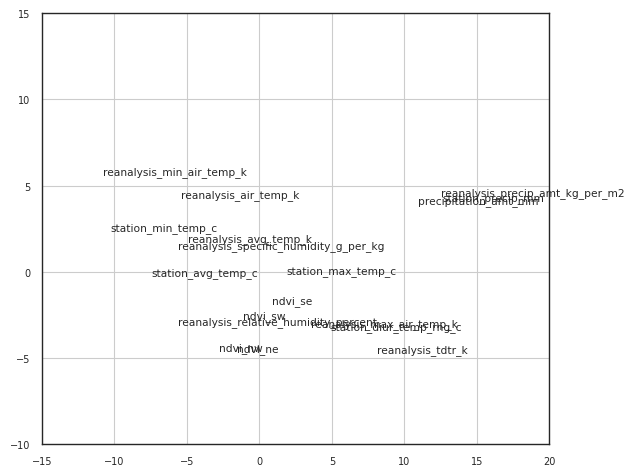

In [ ]:
# 1. Normalization of the data
# http://scikit-learn.org/stable/modules/preprocessing.html
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
features_norm = min_max_scaler.fit_transform(X_train_df)



#1.2. Principal Component Analysis
from sklearn.decomposition import PCA
estimator = PCA (n_components = 2)
X_pca = estimator.fit_transform(features_norm.T)

print("Componentes lineales:\n", estimator.components_)
print("\nRatio de variabilidad: ", estimator.explained_variance_ratio_, "\n")

import matplotlib.pyplot as plt
fig, ax = plt.subplots()

for i in range(len(X_pca)):
    plt.text(X_pca[i][0], X_pca[i][1], names[i])

plt.xlim(-15, 20)
plt.ylim(-10, 15)
ax.grid(True)
fig.tight_layout()
plt.show()

El ratio de Variabilidad en el eje x es del 69% y el del eje y de 16% mostrando que esos dos componentes representan 82% aproximada de la variabilidad, siendo un buen valor para trabajar con 2 componentes.

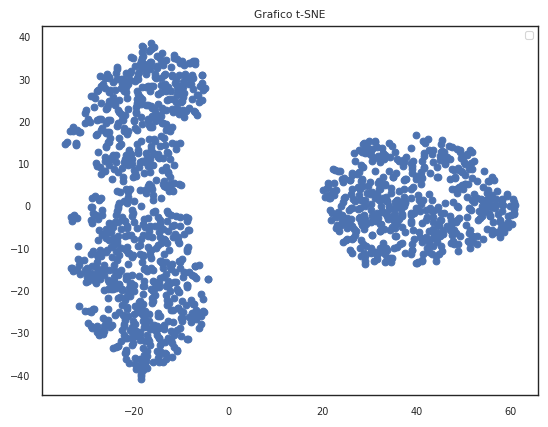

In [ ]:

#Grafico modificado de Datacamp t-SNE https://campus.datacamp.com/courses/unsupervised-learning-in-python/visualization-with-hierarchical-clustering-and-t-sne?ex=10
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

model=TSNE(learning_rate=100)
transformed=model.fit_transform(X_train_df)
xs=transformed[:,0]
ys=transformed[:,1]

plt.scatter(xs, ys)

plt.legend()
plt.title('Grafico t-SNE')
plt.show()




Al analizar el grafico de t-sne podemos observar que existe dos grupos marcados.

---
# Clustering
---

Para realizar los clustering se utilizarán dos componentes ya que nos explican más del 85 % de la variabilidad

In [ ]:
#1.2. Principal Component Analysis
from sklearn.decomposition import PCA
estimator = PCA (n_components = 2)
X_pca = estimator.fit_transform(X_train_df)

print("Componentes lineales:\n", estimator.components_)
print("\nRatio de variabilidad: ", estimator.explained_variance_ratio_, "\n")

Componentes lineales:
 [[ 0.319164    0.2949714   0.19851262  0.2151664   0.05908931 -0.15867674
  -0.00796962  0.36109301 -0.35011811  0.03366424  0.19518439  0.02352659
   0.47512184  0.04995945  0.35375577  0.15946527 -0.14956288  0.05250097]
 [-0.01638951 -0.0104152  -0.0122472  -0.0113152  -0.08981951 -0.43990825
  -0.42494302 -0.21745223 -0.26827126 -0.04130998 -0.07062327 -0.46248468
  -0.03539244 -0.35366858 -0.05390288 -0.22626254 -0.31080907 -0.01742663]]

Ratio de variabilidad:  [0.48315652 0.23173142] 



## K- Means with PCA

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
#Codigo Modificado libro Raschka, S., & Mirjalili, V. (n.d.). Python Machine Learning: Aprendizaje automático y aprendizaje profundo con Python, scikit-learn y TesnorFlow (2nd ed.). MARCOMBO IMPORTACION.
#Chapter 11

wcs=[]
for i in range(1,20):
  kmeans_pca=KMeans(n_clusters=i, init='k-means++', random_state=42, n_init='auto')
  kmeans_pca.fit(X_pca)
  wcs.append(kmeans_pca.inertia_)


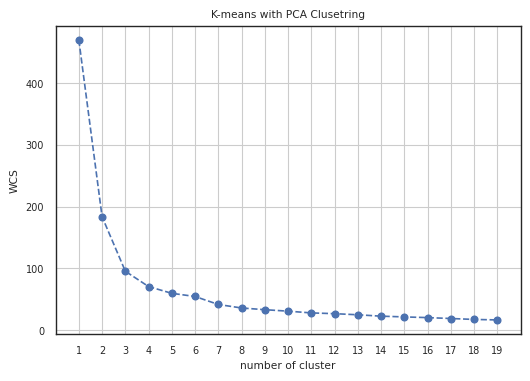

In [ ]:
plt.figure(figsize=(6,4))
plt.plot(range(1,20), wcs, marker='o',linestyle='--')
plt.xlabel('number of cluster')
plt.ylabel('WCS')
plt.title('K-means with PCA Clusetring')
plt.grid(True)
plt.xticks(range(1, 20))
plt.xlim(0,20)
plt.show()

Con el método del codo se puede observar que tres cluster seria un buen valor para el agrupamiento, por lo que para validar este valor se utilizará el puntaje de Davies_bouldin_score y el Silhouette Coefficient.

Método davies_bouldin_score

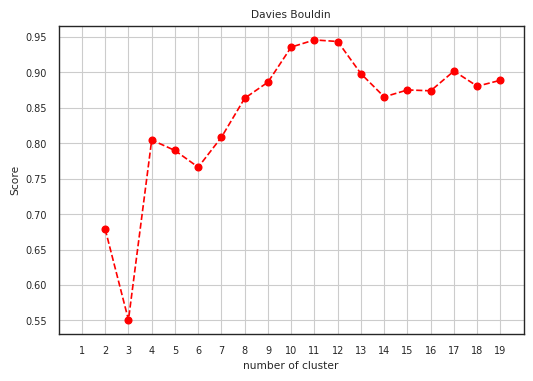

In [ ]:

#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html#sklearn.metrics.davies_bouldin_score
DB=[]
for i in range(2,20):
  kmeans_pca=KMeans(n_clusters=i, init='k-means++', random_state=42, n_init='auto')
  kmeans_pca.fit(X_pca)
  labels = kmeans_pca.labels_
  db_score = davies_bouldin_score(X_pca, labels)
  DB.append(db_score)

plt.figure(figsize=(6,4))
plt.plot(range(2,20),DB, marker='o',linestyle='--', color='red')
plt.xlabel('number of cluster')
plt.ylabel('Score')
plt.title('Davies Bouldin')
plt.grid(True)
plt.xticks(range(1, 20))
plt.xlim(0,20)
plt.show()


Luego de usar el método de Bouldini se encuentra que un buen número de cluster es 3 ya que nos da la puntuación más baja, indicando una mejor agrupación.Esto nos valida lo encontrado con el método del Codo.

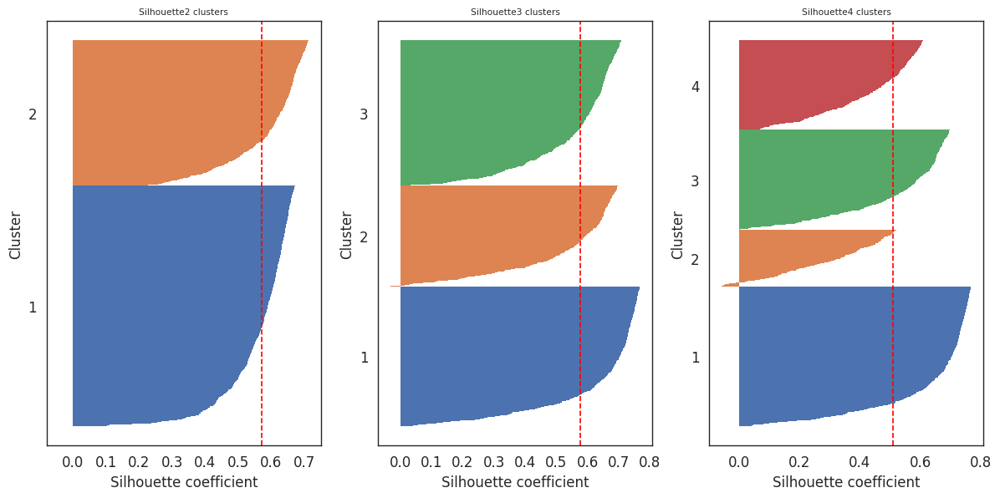

In [ ]:
#Codigo Modificado libro Raschka, S., & Mirjalili, V. (n.d.). Python Machine Learning: Aprendizaje automático y aprendizaje profundo con Python, scikit-learn y TesnorFlow (2nd ed.). MARCOMBO IMPORTACION.
#Chapter 11

n_clusters_range = [2, 3, 4]


plt.figure(figsize=(12, 6))

# Iteramos sobre el rango de números de clusters
for i, n_clusters in enumerate(n_clusters_range, 1):
    # Inicializamos y ajustamos el modelo de KMeans
    km = KMeans(n_clusters=n_clusters,
                init='k-means++',
                n_init=10,
                max_iter=300,
                tol=1e-04,
                random_state=0)
    y_km = km.fit_predict(X_pca)

    # Obtenemos las etiquetas de los clusters
    cluster_labels = np.unique(y_km)
    n_clusters = cluster_labels.shape[0]

    # Calculamos los valores de silueta
    silhouette_vals = silhouette_samples(X_pca, y_km, metric='euclidean')
    y_ax_lower, y_ax_upper = 0, 0
    yticks = []

    # Configuramos los subplots
    plt.subplot(1, len(n_clusters_range), i)

    for j, c in enumerate(cluster_labels):
        c_silhouette_vals = silhouette_vals[y_km == c]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)

        plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0,
                 edgecolor='none')
        yticks.append((y_ax_lower + y_ax_upper) / 2.)
        y_ax_lower += len(c_silhouette_vals)

    # Calculamos y trazamos la media de los valores de silueta
    silhouette_avg = np.mean(silhouette_vals)
    plt.axvline(silhouette_avg, color="red", linestyle="--")

    # Configuración del gráfico
    plt.yticks(yticks, cluster_labels + 1)
    plt.ylabel('Cluster', fontsize=12 )
    plt.xlabel('Silhouette coefficient', fontsize=12)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.title(f'Silhouette{n_clusters} clusters')

plt.tight_layout()
plt.show()


Con el método de Silhouette coefficient se puede obsrvar que ne longitudes dos agrupamientos es un buen valor, pero con 3 cluster también se observa un buen agrupamiento.Para Kmeans seleccionaremos un cluster de 3.

In [ ]:
kmeans_pca=KMeans(n_clusters=3, init='k-means++', random_state=42)
kmeans_pca.fit(X_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [ ]:
df_pca_kmeans=pd.concat([train, pd.DataFrame(X_pca)], axis=1)
df_pca_kmeans.columns.values[-2:]=['Componente 1', 'Componente 2']
df_pca_kmeans['Segment K means PCA']=kmeans_pca.labels_


Se grafican las componentes y los valores de labels obtenidos con Kmeans

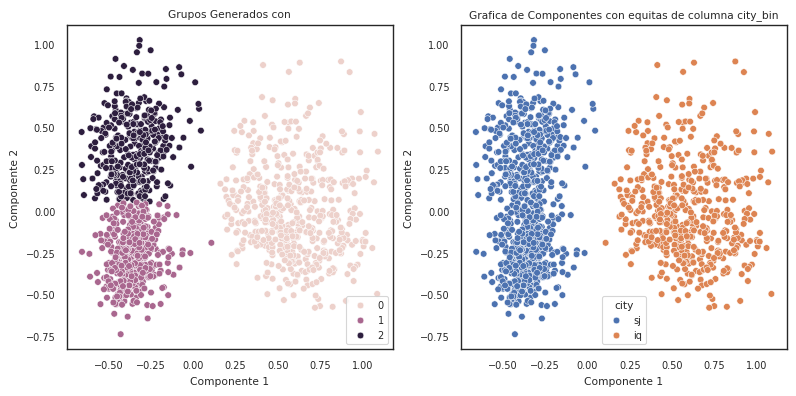

In [ ]:
# Crear una figura con dos subgráficos
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

x_axis=df_pca_kmeans['Componente 1']
y_axis=df_pca_kmeans['Componente 2']
hue_=df_pca_kmeans['Segment K means PCA']
# Graficar el primer scatterplot con el primer hue
sns.scatterplot(x=x_axis, y=y_axis, hue=hue_, ax=axs[0])
axs[0].legend()
axs[0].set_title('Grupos Generados con')

# Graficar el segundo scatterplot con el segundo hue
sns.scatterplot(x=x_axis, y=y_axis, hue=data_total['city'], ax=axs[1])
# axs[1].legend(labels=['Iquitos', 'San Juan'])
axs[1].set_title('Grafica de Componentes con equitas de columna city_bin')

# Ajustar el diseño y mostrar los gráficos
plt.tight_layout()
plt.show()

Al graficar los labels obtenidos mediante Kmeans cuando se le ingresa la data de los dos componentes obtenidos con PCA se puede observar que para el primer grafico de la izquierda con K means 3 la data agrupada a la izquierda de divide en dos grupos y la de la derecha solo en uno, como ejecicio paralelo se grafica en la derecha las componentes del pca pero con las etiquetas del PCA y asi podemos observar que con Kmeans podemos ver que San juan se divide en dos grupos y Iquitos en uno.

## Agrupamamiento Jerárquico

Se medira la bondad clustering para cada methodo utilizado en el agrupamiento jeráquico utilizando las componentes. Para ello, se hará uso del Cophenetic Correlation Coefficient.

In [ ]:
# Codigo tomado de 1 - Métodos de clustering jerárquico.ipynb proporcionado por el docente
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

In [ ]:

from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist


# pdist calcula las distancias entre elementos de nuestro dataset usando la
# métrica indicada (euclideana por defecto)
valores={}
methods=['single', 'complete', 'average','ward','weighted','centroid','median']
for method_ in methods:

  Z = linkage(X_pca, method=method_, metric='euclidean')
  c, coph_dists = cophenet(Z, pdist(X_pca))
  valores[method_]=c

valores

{'single': 0.7852312657817839,
 'complete': 0.8123058404118134,
 'average': 0.8446740520082962,
 'ward': 0.8265790097666015,
 'weighted': 0.8139107888677504,
 'centroid': 0.8392639311507682,
 'median': 0.8030101259255926}

En nuestro diccionario de Resultados del Cophenetic Correlation Coefficient se puede observar que el método single es el que menos valor de coeficiente presenta y esto está relacionado con que es más sensible a valores atípicos. Por otro lado tenemos que los que mejor conservación de las distancias representan son el average y centroid, el centroid en este casi funciona muy bien el tema es que no es tan eficiente cuando los clusteres son de forma irregular. Revisaremos a continuación el algoritmo jerárquico con los métodos single y con el método average.

Agrupamiento Jerárquico (método complete)

In [ ]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage

row_clusters = linkage(pdist(X_pca, metric='euclidean'), method='single')

pd.DataFrame(row_clusters,
             columns=['row label 1', 'row label 2',
                      'distance', 'no. of items in clust.'],
             index=['cluster %d' % (i + 1)
                    for i in range(row_clusters.shape[0])]).head()



,row label 1,row label 2,distance,no. of items in clust.
cluster 1,299.0,431.0,0.000354,2.0
cluster 2,723.0,764.0,0.000379,2.0
cluster 3,257.0,394.0,0.000500,2.0
cluster 4,296.0,698.0,0.000713,2.0
cluster 5,36.0,45.0,0.000908,2.0


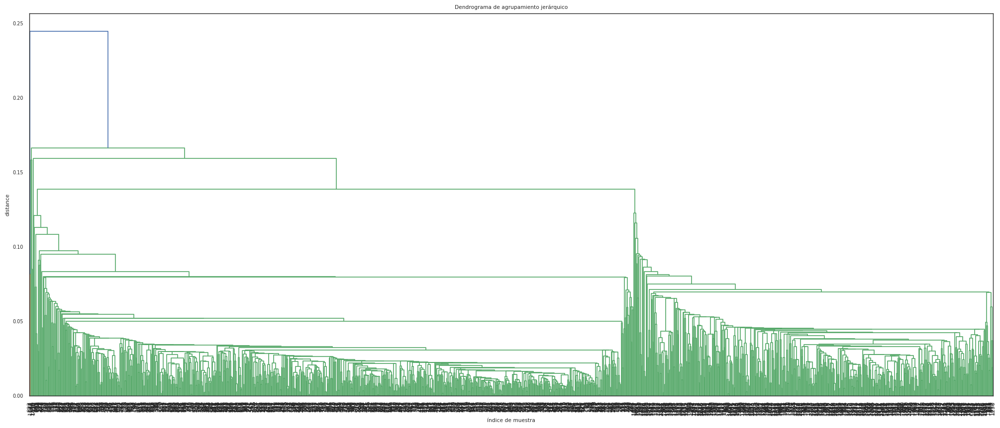

In [ ]:
# calcular el dendrograma completo
plt.figure ( figsize = ( 25 ,  10 ))
plt.title ( 'Dendrograma de agrupamiento jerárquico' )
plt.xlabel ( 'índice de muestra' )
plt.ylabel ( 'distance' )
dendrogram(
    row_clusters ,
    leaf_rotation = 90. ,   # gira las etiquetas del eje x
    leaf_font_size = 8. ,   # tamaño de fuente para las etiquetas del eje x
)
plt .show()

Se decide utilizar un dendograma truncado debido a la cantidad de instancias.

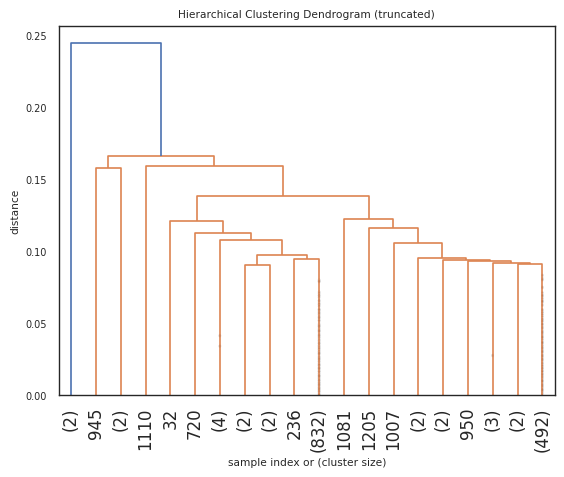

In [ ]:
fancy_dendrogram(
    row_clusters,
    truncate_mode='lastp',
    p=20,
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=0.25,  # useful in small plots so annotations don't overlap
)
plt.show()

Agrupamiento Jerárquico (método Average)

In [ ]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage

row_clusters = linkage(pdist(X_pca, metric='euclidean'), method='average')

pd.DataFrame(row_clusters,
             columns=['row label 1', 'row label 2',
                      'distance', 'no. of items in clust.'],
             index=['cluster %d' % (i + 1)
                    for i in range(row_clusters.shape[0])]).head()

,row label 1,row label 2,distance,no. of items in clust.
cluster 1,299.0,431.0,0.000354,2.0
cluster 2,723.0,764.0,0.000379,2.0
cluster 3,257.0,394.0,0.000500,2.0
cluster 4,296.0,698.0,0.000713,2.0
cluster 5,36.0,45.0,0.000908,2.0


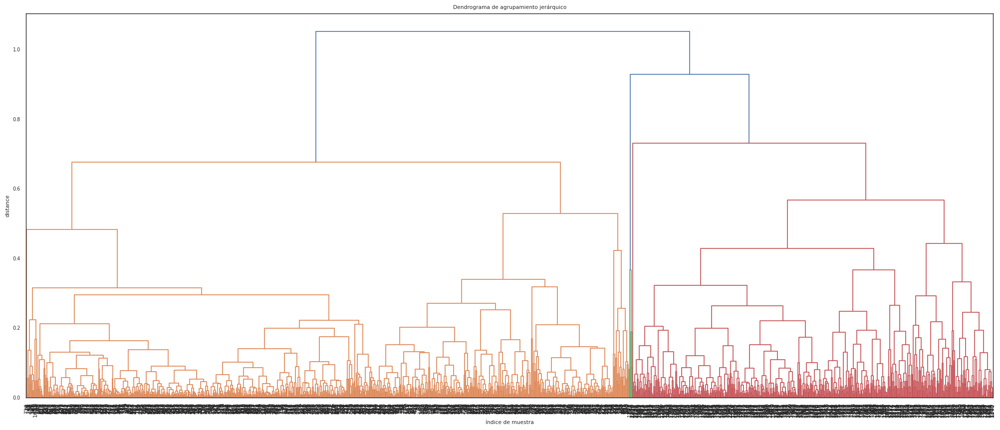

In [ ]:
# calcular el dendrograma completo
plt.figure ( figsize = ( 25 ,  10 ))
plt.title ( 'Dendrograma de agrupamiento jerárquico' )
plt.xlabel ( 'índice de muestra' )
plt.ylabel ( 'distance' )
dendrogram(
    row_clusters ,
    leaf_rotation = 90. ,   # gira las etiquetas del eje x
    leaf_font_size = 8. ,   # tamaño de fuente para las etiquetas del eje x
)
plt .show()

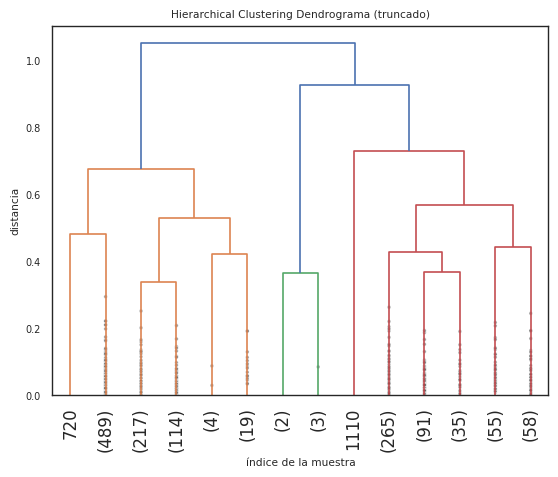

In [ ]:
# Codigo tomado de 1 - Métodos de clustering jerárquico.ipynb proporcionado por el docente
from scipy.cluster.hierarchy import dendrogram
plt.title('Hierarchical Clustering Dendrograma (truncado)')
plt.xlabel('índice de la muestra')
plt.ylabel('distancia')
dendrogram(
    row_clusters,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=14,  # definimos p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    # to get a distribution impression in truncated branches
)
plt.show()

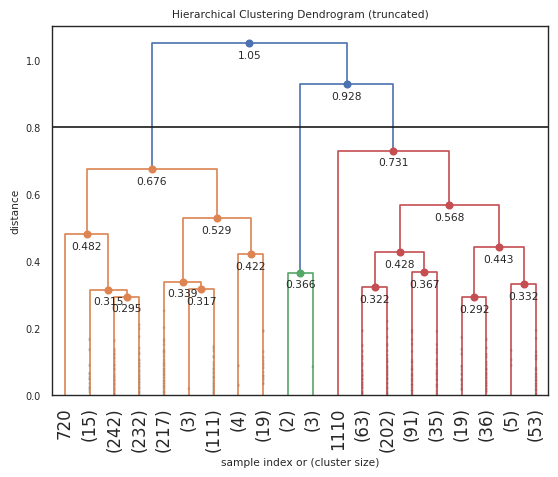

In [ ]:
d_max = 0.8
fancy_dendrogram(
    row_clusters,
    truncate_mode='lastp',
    p=20,
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=0.15,  # useful in small plots so annotations don't overlap
    max_d=d_max,
)
plt.show()

Un buen punto de Corte es en una distancia de 0.8 ya que se observa la mayor lineal vertical a la derecha en el cluster generado después de la unión de los cluster de color naranja.Este punto de Corte nos da tres.

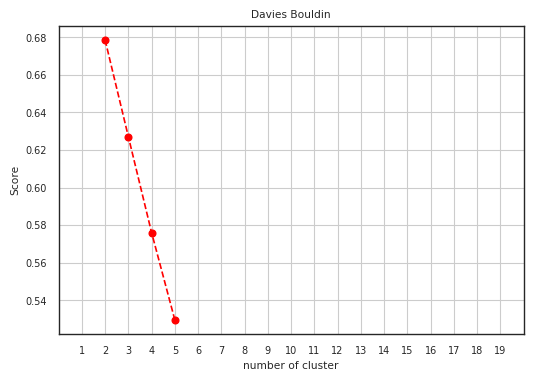

In [ ]:
#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html#sklearn.metrics.davies_bouldin_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import AgglomerativeClustering

DB=[]
for i in range(2,6):
  cluster = AgglomerativeClustering(n_clusters=i, metric='euclidean', linkage='average')
  clusters = cluster.fit_predict(X_pca)
  db_score = davies_bouldin_score(X_pca, clusters)
  DB.append(db_score)



plt.figure(figsize=(6,4))
plt.plot(range(2,6),DB, marker='o',linestyle='--', color='red')
plt.xlabel('number of cluster')
plt.ylabel('Score')
plt.title('Davies Bouldin')
plt.grid(True)
plt.xticks(range(1, 20))
plt.xlim(0,20)
plt.show()

Al evaluar e puntaje de Davies Bouldin se encuentra que la menor puntuación se da en 5 cluster por lo que se realizará con esta cantidad para revisar los resultados.

[1 1 4 ... 0 0 0]


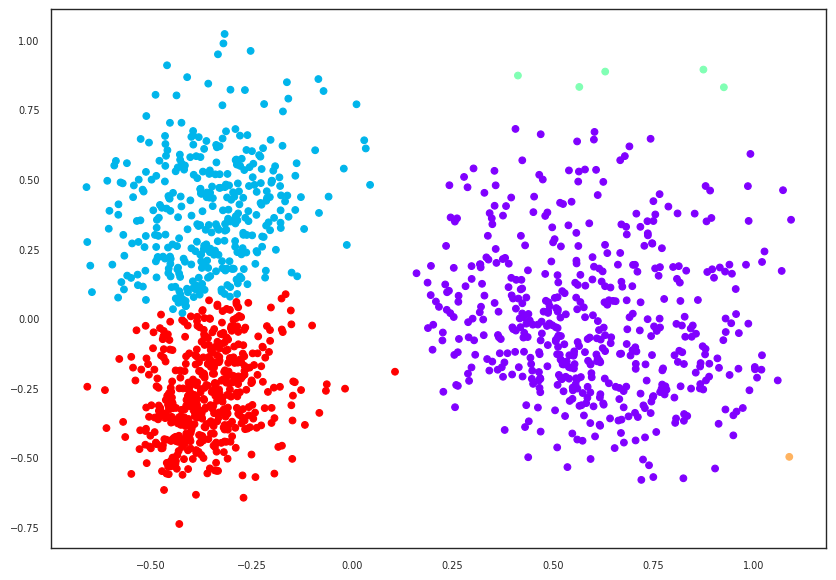

In [ ]:
#Para cuando se necesita clasificar un elemento nuevo se utiliza AgglometaviClustering
# Codigo tomado de 1 - Métodos de clustering jerárquico.ipynb proporcionado por el docente
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='average')
clusters = cluster.fit_predict(X_pca)
print(clusters)

plt.figure(figsize=(10, 7))
X_pca
plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster.labels_, cmap='rainbow')
plt.show()

Al utilizar el Cluster 5 con el método avergae se puede observar que es muy parecido a los resultados con el Kmeans en donde se observa marcado los tres grupos pero aqui además de esos tres grupos predominantes se observa que los dos grupos restantes los ve como puntos outliers. Esto es porque este algortimo es una combinación de los métodos complete y single.Para revisar bien estos resiltados se utilizará el método ward que es más robusto.

Agrupamiento Jerárquico (método Ward)

In [ ]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage

row_clusters = linkage(pdist(X_pca, metric='euclidean'), method='ward')

pd.DataFrame(row_clusters,
             columns=['row label 1', 'row label 2',
                      'distance', 'no. of items in clust.'],
             index=['cluster %d' % (i + 1)
                    for i in range(row_clusters.shape[0])]).head()

,row label 1,row label 2,distance,no. of items in clust.
cluster 1,299.0,431.0,0.000354,2.0
cluster 2,723.0,764.0,0.000379,2.0
cluster 3,257.0,394.0,0.000500,2.0
cluster 4,296.0,698.0,0.000713,2.0
cluster 5,36.0,45.0,0.000908,2.0


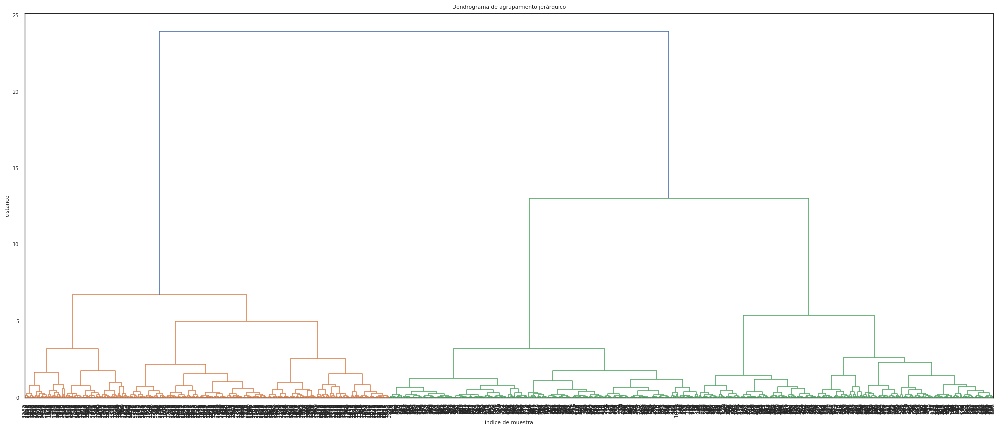

In [ ]:
# calcular el dendrograma completo
plt.figure ( figsize = ( 25 ,  10 ))
plt.title ( 'Dendrograma de agrupamiento jerárquico' )
plt.xlabel ( 'índice de muestra' )
plt.ylabel ( 'distance' )
dendrogram(
    row_clusters ,
    leaf_rotation = 90. ,   # gira las etiquetas del eje x
    leaf_font_size = 8. ,   # tamaño de fuente para las etiquetas del eje x
)
plt .show()

In [ ]:
d_max = 15
fancy_dendrogram(
    row_clusters,
    truncate_mode='lastp',
    p=20,
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=0.15,  # useful in small plots so annotations don't overlap
    max_d=d_max,
)
plt.show()

Con el método Ward se puede observa que una distancia de 15 es un buen valor de corte, obteniendo un cluster de dos.

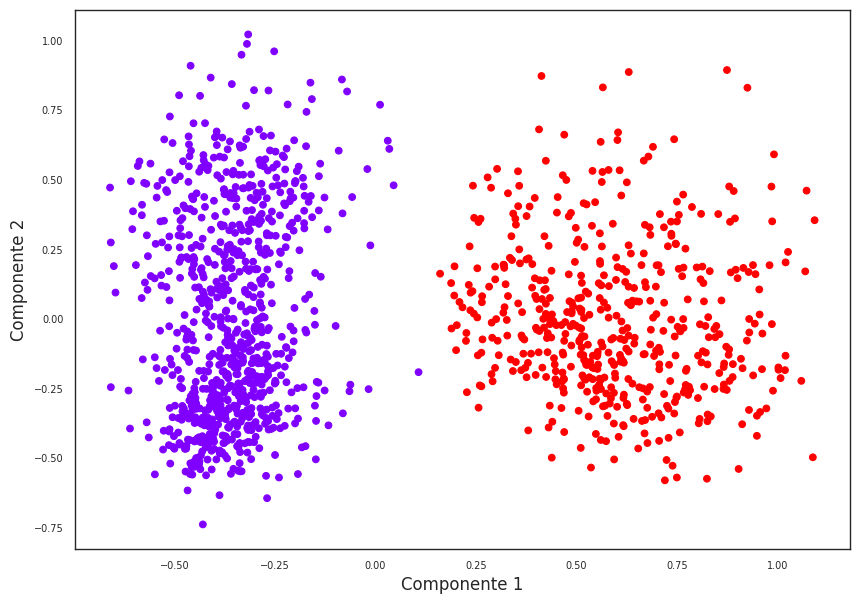

In [ ]:
#Para cuando se necesita clasificar un elemento nuevo se utiliza AgglometaviClustering
# Codigo tomado de 1 - Métodos de clustering jerárquico.ipynb proporcionado por el docente
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
clusters = cluster.fit_predict(X_pca)


plt.figure(figsize=(10, 7))
X_pca
plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster.labels_, cmap='rainbow')
plt.xlabel('Componente 1', fontsize=12)
plt.ylabel('Componente 2', fontsize=12)
plt.show()

Con el método ward se pueden observar dos grupos, pro lo que cada método tiene sus ventajes, en el average puede encontrar dos grupos difrenetes para la ciudad de San juan y también valores outliers, mediante el método ward se puede ascoaira más a que grupa por ciudad.

## DB Scan

El primer paso para usar apropiadamente el algoritmo DBSCAN es tener un valor de eps y min_samples por lo que para encontrar el mejor par de valores utilizaremos la métrica de silhouette en donde si obtenemos valores más cercanos a 1 se nos indica que el objeto está bien clasificado y muy separado de otros clusters, mientras si obtenemos un valor por debajo de 0 cercano a -1, nos indica que el objeto o los onjetos se podrian haber asignado al cluster incorrecto.

In [ ]:
#codigo Modificado de https://pub.towardsai.net/in-depth-understanding-of-dbscan-clustering-machine-learning-algorithm-with-python-c4e1dd9b5c27
from sklearn.cluster import DBSCAN
from sklearn import metrics


eps_values = [0.1, 0.14,0.15,0.155,0.2]  #valores para el parámetro eps
min_samples_values = [2, 5, 10]  #valores para el parámetro min_samples

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_pca)
        if len(set(labels)) > 1:  # Verifica que haya al menos dos grupos encontrados
            silhouette_score = metrics.silhouette_score(X_pca, labels)
            print(f"For eps={eps} and min_samples={min_samples}, silhouette score is {silhouette_score}")


For eps=0.1 and min_samples=2, silhouette score is 0.4065779013468892
For eps=0.1 and min_samples=5, silhouette score is 0.5261505196823403
For eps=0.1 and min_samples=10, silhouette score is 0.5183335486241076
For eps=0.14 and min_samples=2, silhouette score is 0.2632918596402022
For eps=0.14 and min_samples=5, silhouette score is 0.5318242861382081
For eps=0.14 and min_samples=10, silhouette score is 0.5396690826167327
For eps=0.15 and min_samples=2, silhouette score is 0.2632918596402022
For eps=0.15 and min_samples=5, silhouette score is 0.5318242861382081
For eps=0.15 and min_samples=10, silhouette score is 0.5349495834797262
For eps=0.155 and min_samples=2, silhouette score is 0.2632918596402022
For eps=0.155 and min_samples=5, silhouette score is 0.5318242861382081
For eps=0.155 and min_samples=10, silhouette score is 0.536259007495271
For eps=0.2 and min_samples=2, silhouette score is 0.3897697403485423
For eps=0.2 and min_samples=5, silhouette score is 0.3897697403485423
For e

la mejor puntuación para el coeficiente de silhouette se puede observar a partir de un eps de 0.14 con 10 muestras minimas pero es un valor muy cercado a los eps de 0.1 y 0.15 con 10 puntos minimos.Se graficaran los tres valores de eps para observar como son los agrupamientos.

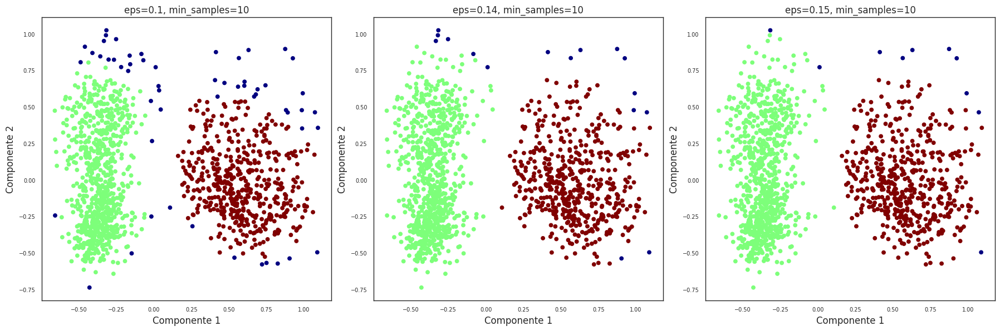

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Valores de eps y min_samples
eps_values = [0.1, 0.14, 0.15]
min_samples_value = 10

# Crear una figura con subgráficos
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for i, eps in enumerate(eps_values):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples_value)
    model = dbscan.fit(X_pca)
    labels = model.labels_

    axs[i].scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='jet')
    axs[i].set_title(f'eps={eps}, min_samples={min_samples_value}', fontsize=12)
    axs[i].set_xlabel('Componente 1', fontsize=12)
    axs[i].set_ylabel('Componente 2', fontsize=12)

plt.tight_layout()
plt.show()


Luego de Graficar los resultados con los tres valores de Eps, se observa que acorde a la metrica de la Silueta el eps 0.14 observa los dos grupos a sociados a las ciudades y una cantidad de outliers, importante e intermedia entre los valores de eps 0.1 y 0.15.

## Gaussian Mixture Models

In [ ]:
from sklearn.mixture import GaussianMixture

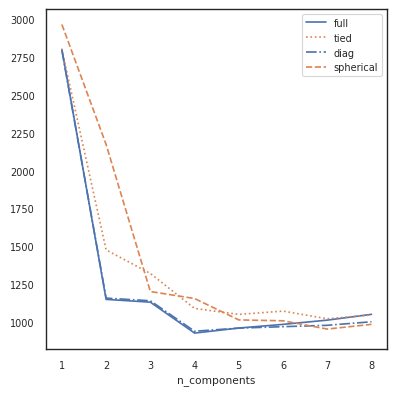

In [ ]:
#Codigo tomado de libro Estadística práctica para ciencia de datos con R y Python
#https://github.com/gedeck/practical-statistics-for-data-scientists/blob/master/python/notebooks/Chapter%207%20-%20Unsupervised%20Learning.ipynb

results = []
covariance_types = ['full', 'tied', 'diag', 'spherical']
for n_components in range(1, 9):
    for covariance_type in covariance_types:
        mclust = GaussianMixture(n_components = n_components, warm_start=True,
                                 covariance_type = covariance_type)
        mclust.fit(X_pca)
        results.append({
            'bic': mclust.bic(X_pca),
            'n_components': n_components,
            'covariance_type': covariance_type,
        })

results = pd.DataFrame(results)

colors = ['C0', 'C1', 'C2', 'C3']
styles = ['C0-','C1:','C0-.', 'C1--']

fig, ax = plt.subplots(figsize=(4, 4))
for i, covariance_type in enumerate(covariance_types):
    subset = results.loc[results.covariance_type == covariance_type, :]
    subset.plot(x='n_components', y='bic', ax=ax, label=covariance_type,
                kind='line', style=styles[i]) # , color=colors[i])

plt.tight_layout()
plt.show()

Mediante el grafico anterior se puede observar que se obtiene los valores más bajos de AIC para el typo de covarianza full, entre 3 y 4 componentes.Por lo que se graficarán estos vavlores con estas cantidades de componentes.

In [ ]:

import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Valores de eps y min_samples
n_components = [2, 3, 4]


# Crear una figura con subgráficos
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for i, component in enumerate(n_components):
    mclust = GaussianMixture(n_components = component, warm_start=True,
                                 covariance_type = 'full').fit(X_pca)
    colors =mclust.predict(X_pca)
    axs[i].scatter(X_pca[:, 0], X_pca[:, 1], c=colors, cmap='jet')
    axs[i].set_title(f'n_component={component}', fontsize=12)
    axs[i].set_xlabel('Componente 1', fontsize=12)
    axs[i].set_ylabel('Componente 2', fontsize=12)

plt.tight_layout()
plt.show()

Con 3 componentes se obtienen valores muy parecidos a los obtenido con K means y con lo obtenido en el algoritmo jerárquico en donde se encontraban tres grupos.

---
# Conclusiones
---

* Se seleccionaron las característica con valores numéricos, no se selecciono la variable city_bin convertida a valores de 0 y 1 para no brindarle esta información a los algoritmos y asi sesgar lo sresultados por ciudad.
* Mediante la exploración se observaban dos comportamientos
entre algunas Features, y esto está asociado con las dos ciudades San Juan e Iquitos y las variaciones dadas en cada una, por lo que la exploración inicialmente se dio en base a las ciudades.
*	Al usar TSNE se puede observar que se encuentran los dos grupos asociados a las ciudades.
*	Kmeans mediante el método del codo recomienda 3 clúster, al graficar se puede observar que dos grupos están asociados a la ciudad de San juan y el otro a la ciudad de Iquitos. Esto también está dado en base de que en San juan se encuentran mayor cantidad de datos asociados con un muestre 10 años antes a lo que fue en la ciudad de Iquitos, En san juan se obtienen datos a partir de 1990 mientras que para Iquitos a partir del año 2000.
*	Mediante el Algoritmo jerárquico usando el método average el cual obtuvo el mejor valor de Cophenetic Correlation Coefficiente y apoyado en el puntaje de Davies Bouldin se encuentra que un cluster de 5 es un buen valor para mostrar las relaciones, el grafico para esta situación muestra un comportamiento similar para Kmeans en dos en tres grupos se observa la cantidad de datos, los dos grupos restantes los observa como outliers por lo que este algoritmo resulta interesante en que consigue resultados similares a los obtenidos al K means pero además muestra los outliers considerados y esto es en base a que el método average resulta de la combinación de los métodos single y complete. Al usar el método Ward se encuentra una relación de dos grupos relacionada con las dos ciudades.
*	Mediante DBScan el algoritmo muestra más relaciones asociadas a los dos grupos de las ciudades y con el eps de 0.14 el cual fue el que mejor puntaje obtuvo mediante la métrica de la silueta 0.539 con respecto el segundo mejor eps igual a 0.15 y métrica de 0. 5349.Para estos valores no se encuentra una gran diferencia de puntaje. al graficar se observa que los dos ven los dos grupos relacionados con las ciudades y además outliers.
*	Para el método de las Gausianas se observa que los valores más bajos de AIC para el tipo de covarianza full, se dan entre 3 y 4 cluster, al graficar esto se observa que con tres componentes se da el agrupamiento similar en K means en donde en los valores relacionados para la ciudad de San juan se encuentran dos grupos y para Iquitos solo un grupo.
*	El método considerado como mejor para realizar una agrupación con respecto a las características es el método obtenido con el Jerárquico y el puntaje de Davies con k=5 en donde es claro los 3 grupos predominantes asociado con lo visto en K menas y el método Gaussiano, pero además muestra como dos grupos unos valores de outliers.
*	Como trabajo futuro seria bueno revisar como es el comportamiento por cada ciudad para revisar si se puede encontrar a detalle algunos agrupamientos adicionales.



# Referencias


References
Babbar, T. (2023, June 14). Unveiling the power of PCA: Turbocharge your data science with dimensionality reduction! AlliedOffsets. https://medium.com/alliedoffsets/unveiling-the-power-of-pca-turbocharge-your-data-science-with-dimensionality-reduction-fa9d1fc6e510

Bruce, P., Bruce, A., & Gedeck, P. (2022). Estadística práctica para ciencia de datos con R y Python (1st ed.). Marcombo.

Chauhan, A. (2023, December 28). In-depth understanding of DBSCAN clustering machine learning algorithm with python. Towards AI. https://pub.towardsai.net/in-depth-understanding-of-dbscan-clustering-machine-learning-algorithm-with-python-c4e1dd9b5c27

Kaloyanova, E. (2020, March 10). How to combine PCA and K-means clustering in Python? 365 Data Science. https://365datascience.com/tutorials/python-tutorials/pca-k-means/

Raschka, S., & Mirjalili, V. (n.d.). Python Machine Learning: Aprendizaje automático y aprendizaje profundo con Python, scikit-learn y TesnorFlow (2nd ed.). MARCOMBO IMPORTACION.

Sklearn.Metrics.Davies_bouldin_score. (n.d.). Scikit-Learn. Retrieved March 2, 2024, from https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html

Visualization with Hierarchical Clustering and t-SNE - t-SNE for 2-dimensional maps. (2023, March 29).

(N.d.). Datacamp.com. Retrieved March 2, 2024, from https://app.datacamp.com/learn/courses/unsupervised-learning-in-python

